#Utils

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
#@title Rodar célula
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import os
import glob
from IPython.display import Image, display
import random
import seaborn as sns
import shutil


LABEL_DIR = "/content/gdrive/MyDrive/Nucleos/Datasets/original/test/labels/"
DETECTION_SRC = '/content/yolov5/runs/detect/'
CONFIGS_LIST =["sr", "mr", "lr", "xr",
               "swr", "mwr", "lwr", "xwr",
               "sdr", "mdr", "ldr", "xdr",
               "swdr", "mwdr", "lwdr", "xwdr",
               ]
PATH_CVAL = "/content/gdrive/MyDrive/Nucleos/CVal/"


def draw_annotation(img_path, label_path):
  img = cv2.imread(img_path)
  dh, dw, _ = img.shape

  fl = open(label_path, 'r')
  data = fl.readlines()
  fl.close()

  for dt in data:

      # Split string to float
      _, x, y, w, h = map(float, dt.split(' '))

      # Taken from https://github.com/pjreddie/darknet/blob/810d7f797bdb2f021dbe65d2524c2ff6b8ab5c8b/src/image.c#L283-L291
      # via https://stackoverflow.com/questions/44544471/how-to-get-the-coordinates-of-the-bounding-box-in-yolo-object-detection#comment102178409_44592380
      l = int((x - w / 2) * dw)
      r = int((x + w / 2) * dw)
      t = int((y - h / 2) * dh)
      b = int((y + h / 2) * dh)
      
      if l < 0:
          l = 0
      if r > dw - 1:
          r = dw - 1
      if t < 0:
          t = 0
      if b > dh - 1:
          b = dh - 1

      cv2.rectangle(img, (l, t), (r, b), (0, 100, 0), 1)
  
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  return img


def cria_df(PATH):
  
  if PATH[-3:] == 'txt':
    data = pd.read_csv(PATH, delimiter=r"\s+", header=None)
    
    data.columns = ["Epoch", "MEM", "box", "obj", 
                    "cls", "tot", "targets", "img_sz",
                    "P", "R", "mAP", "mAP2", "vbox", 
                    "vobj", "val_C"]
    
    data = data.drop(['Epoch', 'MEM', 'cls', 'tot', 'targets', 
                      'img_sz','val_C'], axis=1)  
  
  elif PATH[-3:] == 'csv':
    data = pd.read_csv(PATH)
    data = data.drop(['               epoch', 
                  '      train/cls_loss',
                  '        val/cls_loss'], axis=1)

    data.rename(columns={'      train/box_loss' : 'box',
                        '      train/obj_loss' : 'obj',
                        '   metrics/precision' : 'P', 
                        '      metrics/recall' : 'R',
                        '     metrics/mAP_0.5' : 'mAP', 
                        'metrics/mAP_0.5:0.95' :'mAP2',
                        '        val/box_loss' :'vbox',
                        '        val/obj_loss' :'vobj'
                        }, inplace=True)
  
  data["F1"] = 2*data["P"]*data["R"]/(data["P"] + data["R"])
  data["Fit"] = 0.9*data["mAP2"] + 0.1*data["mAP"]
  return data


def cria_df_splits(v1, v2):
  data = pd.DataFrame()

  for i in range(5):
    src = PATH_CVAL + v1 + v2 + str(i+1) + '/results.txt'
    if not os.path.exists(src):
      src = src[:-3] + 'csv'

    try:
      split = cria_df(src)
    except:
      continue
    
    try:
      idx=split["Fit"].idxmax()
      series = pd.Series(split.iloc[idx, :].values, index=split.columns)
    except:
      print("Error in split" + str(i+1) + " of version " + v1 + v2)
      continue
    data = data.append(series, ignore_index=True)
  return data


def plot_loss(df, ylim=False):
  fig = plt.figure(figsize=(21,9)) 
  train_loss = df['box'] + df['obj']
  test_loss = df['vbox'] + df['vobj']
  plt.plot(train_loss, marker='o', markersize=5)
  plt.plot(test_loss, marker='o', markersize=5)
  fig.suptitle('Curva de Loss', fontsize=30)
  if ylim:
    top = 1.2*max(train_loss.max(), test_loss.max())
    plt.ylim(top=top)
  plt.grid(axis='y', ls='--')
  plt.xlabel('Época', fontsize=20)
  plt.ylabel('Loss', fontsize=20)
  plt.legend(["Treino", 
              "Teste"],
              fontsize=20,
              loc = 1)
  plt.show()


def plot_map(df1, df2, legends, ylim=False):
  fig = plt.figure(figsize=(21,9)) 
  df1["mAP"].plot(marker='o', markersize=5)
  df2["mAP"].plot(marker='o', markersize=5)
  fig.suptitle('Curva de AP', fontsize=30)
  if ylim:
    ylim=df1["mAP"].max()*1.25
    plt.ylim(top=ylim)
  plt.grid(axis='y', ls='--')
  plt.xlabel('Época', fontsize=20)
  plt.ylabel('AP', fontsize=20)
  plt.legend([legends[0], 
              legends[1]],
              fontsize=20,
              loc = 1)
  plt.show()


def plot_side_by_side(PATH, title):

  NUM_ROWS = 1
  IMGs_IN_ROW = 2
  f, ax = plt.subplots(NUM_ROWS, IMGs_IN_ROW, figsize=(16,8))

  img1 = plt.imread(PATH + "/F1_curve.png")
  img2 = plt.imread(PATH + "/PR_curve.png")

  ax[0].imshow(img1)
  ax[1].imshow(img2)

  ax[0].set_title('F1 x Confiança', fontsize=20)
  ax[1].set_title('Precisão x Recall', fontsize=20)
  ax[0].axis('off')
  ax[1].axis('off')

  f.suptitle(title, fontsize=30)
  f.subplots_adjust(wspace=0)
  plt.tight_layout()
  plt.show()


def show_results(isDataAug=True):
  src = "/content/gdrive/MyDrive/Nucleos/Retreino/"

  if not isDataAug:
    configs_dict = {
      "sr": "Versão S sem pré-treino",
      "mr": "Versão M sem pré-treino",
      "lr": "Versão L sem pré-treino",
      "xr": "Versão X sem pré-treino",
      "swr": "Versão S com pré-treino",
      "mwr": "Versão M com pré-treino",
      "lwr": "Versão L com pré-treino",
      "xwr": "Versão X com pré-treino"
    }
  else:
    configs_dict = {
      "sdr": "Versão S sem pré-treino",
      "mdr": "Versão M sem pré-treino",
      "ldr": "Versão L sem pré-treino",
      "xdr": "Versão X sem pré-treino",
      "swdr": "Versão S com pré-treino",
      "mwdr": "Versão M com pré-treino",
      "lwdr": "Versão L com pré-treino",
      "xwdr": "Versão X com pré-treino"
    }
      
  for key in configs_dict.keys():
    plot_side_by_side(src + "v5" + key, configs_dict[key])
    print("\n")


def compare_detections(target, title):
  img_list = []

  for version in target:
    for imageName in glob.glob(DETECTION_SRC + version + '/*.jpg'): #assuming JPG
        #finds labelname corresponding to image
        filename = imageName.split("/")[-1].split(".jpg")[0]
        label_path = LABEL_DIR + filename + ".txt"
        img_list.append(draw_annotation(imageName, label_path))
        #display(Image(filename=imageName))

  NUM_ROWS = 2
  IMGs_IN_ROW = 2
  f, ax = plt.subplots(NUM_ROWS, IMGs_IN_ROW)

  ax[0][0].imshow(img_list[0])
  ax[0][1].imshow(img_list[1])
  ax[1][0].imshow(img_list[2])
  ax[1][1].imshow(img_list[3])

  ax[0][0].set_title('YOLOv5 S', fontsize=20)
  ax[0][1].set_title('YOLOv5 M', fontsize=20)
  ax[1][0].set_title('YOLOv5 L', fontsize=20)
  ax[1][1].set_title('YOLOv5 X', fontsize=20)

  for row in ax:
    for im in row:
      im.set_xticks([])
      im.set_yticks([])

  f.set_figheight(16)
  f.set_figwidth(16)
  f.suptitle(title, fontsize=30)
  plt.tight_layout(rect=[0, 0, 0.92, 0.95])
  f.subplots_adjust(wspace=0)
  plt.show()


def compara_redes(detections, title, set_title=False):
  img_list=[]

  for detection in detections:
    if os.path.isfile(detection):
      imageName=detection
    else:
      imageName = glob.glob(detection + '/*.jpg')[0] #assuming JPG
      #finds labelname corresponding to image
    filename = imageName.split("/")[-1].split(".jpg")[0]
    label_path = LABEL_DIR + filename + ".txt"
    img_list.append(draw_annotation(imageName, label_path))
    #display(Image(filename=imageName))

  NUM_ROWS = 1
  IMGs_IN_ROW = 2
  f, ax = plt.subplots(NUM_ROWS, IMGs_IN_ROW, figsize=(16, 8))

  ax[0].imshow(img_list[0])
  ax[1].imshow(img_list[1])

  if set_title:
    ax[0].set_title(set_title[0], fontsize=20)
    ax[1].set_title(set_title[1], fontsize=20)

  for im in ax:
    im.set_xticks([])
    im.set_yticks([])

  f.suptitle(title, fontsize=30)
  f.subplots_adjust(wspace=0)
  plt.show()


def best_worst(vs_names):
  for vs_name in vs_names:
    if os.path.exists("map.txt"):
      os.remove("map.txt")
      
    if os.path.exists("test_images"):
      shutil.rmtree("test_images")
    
    !touch map.txt
    src = "/content/gdrive/MyDrive/Nucleos/Datasets/original/test"
    weight_path = "/content/gdrive/MyDrive/Nucleos/Retreino/" + vs_name + "/weights/best.pt"
    if not os.path.exists(weight_path):
      print("Error. File 'best.pt' not found in .../", weight_path.split('Retreino/')[1])
      continue


    if not os.path.exists("/content/gdrive/MyDrive/Nucleos/tmp/worst_detections"):
      os.mkdir("/content/gdrive/MyDrive/Nucleos/tmp/worst_detections")

    if not os.path.exists("/content/gdrive/MyDrive/Nucleos/tmp/best_detections"):
      os.mkdir("/content/gdrive/MyDrive/Nucleos/tmp/best_detections")

    if (not os.path.exists("/content/gdrive/MyDrive/Nucleos/tmp/best_detections/" + vs_name+".jpg") 
    or not os.path.exists("/content/gdrive/MyDrive/Nucleos/tmp/worst_detections/" + vs_name+".jpg")):
      
      for image in sorted(os.listdir(src + "/images")):
        os.mkdir("test_images")
        os.mkdir("test_images/images")
        os.mkdir("test_images/labels")
        filename = image.split("/")[-1].split(".jpg")[0]
        imagename = src + "/images/" + filename + ".jpg"
        labelname = src + "/labels/" + filename + ".txt"

        shutil.copy(imagename, "test_images/images")
        shutil.copy(labelname, "test_images/labels")
        !python test.py --weights $weight_path --data /content/data.yaml --img 416 
        %rm -rf test_images

      f = open("map.txt", "r")
      results = [float(x.strip()) for x in f] 
      max_idx = results.index(max(results))
      min_idx = results.index(min(results))
      test_images = sorted(os.listdir(src + "/images"))
      best_img = src + "/images/" + test_images[max_idx]
      worst_img = src + "/images/" + test_images[min_idx]
      f.close()

      if not os.path.exists("best_maps.txt"):
        !touch best_maps.txt
      
      f=open("best_maps.txt", "a")
      f.write(str(vs_name)+ ": " + "(" + str(max_idx) + "," + str(max(results)) + ")\n")
      f.close()

      version = [vs_name+"b", vs_name+"w"]
      img_list=[]
      name_best = version[0]
      name_worst = version[1]   

      if not os.path.exists("/content/gdrive/MyDrive/Nucleos/tmp/best_detections/" + vs_name +".jpg"):
        !python detect.py --weights $weight_path --img 416 --source $best_img --name $name_best
      else:
        print("Configuration ", name_best, " already stored")
      
      if not os.path.exists("/content/gdrive/MyDrive/Nucleos/tmp/worst_detections/" + vs_name+".jpg"):
        !python detect.py --weights $weight_path --img 416 --source $worst_img --name $name_worst
      else:
        print("Configuration ", name_worst, " already stored") 
        continue

      LABEL_DIR = "/content/gdrive/MyDrive/Nucleos/Datasets/original/test/labels/"
      for v in version:
        for imageName in glob.glob('/content/yolov5/runs/detect/' + v + '/*.jpg'): #assuming JPG
          #finds labelname corresponding to image
          filename = imageName.split("/")[-1].split(".jpg")[0]
          label_path = LABEL_DIR + filename + ".txt"
          img_list.append(draw_annotation(imageName, label_path))
          #display(Image(filename=imageName))

      cv2.imwrite("/content/gdrive/MyDrive/Nucleos/tmp/best_detections/" + vs_name + ".jpg", img_list[0])
      cv2.imwrite("/content/gdrive/MyDrive/Nucleos/tmp/worst_detections/" + vs_name + ".jpg", img_list[1])
    
    else:
      print("Configurations ", vs_name, " already stored")

#Estatísticas da Validação Cruzada




In [ ]:
#@title Cria df com resultados dos splits
df_s = cria_df_splits("v5s", "") 
df_m = cria_df_splits("v5m", "")
df_l = cria_df_splits("v5l", "")
df_x = cria_df_splits("v5x", "")
df_sw = cria_df_splits("v5s", "w") 
df_mw = cria_df_splits("v5m", "w")
df_lw = cria_df_splits("v5l", "w")
df_xw = cria_df_splits("v5x", "w")
df_sd = cria_df_splits("v5s", "d") 
df_md = cria_df_splits("v5m", "d")
df_ld = cria_df_splits("v5l", "d")
df_xd = cria_df_splits("v5x", "d")
df_swd = cria_df_splits("v5s", "wd") 
df_mwd = cria_df_splits("v5m", "wd")
df_lwd = cria_df_splits("v5l", "wd")
df_xwd = cria_df_splits("v5x", "wd")


##Gráficos de Dispersão

###Stripplot

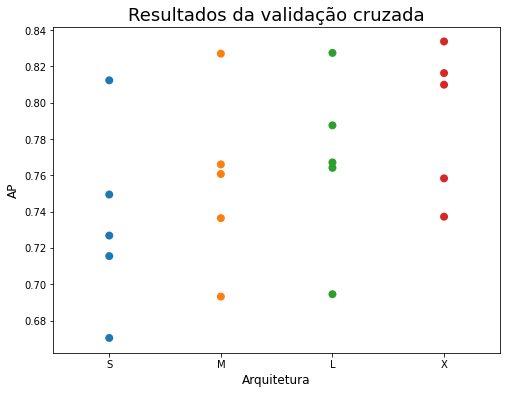

In [ ]:
plt.figure(figsize=(8,6))
ax = sns.stripplot(data=[df_s["mAP"], df_m["mAP"], df_l["mAP"], df_x["mAP"]], size=8, jitter=0)
ax.set_xticklabels(["S", "M", "L", "X"])
ax.set_ylabel("AP", fontsize=12)
ax.set_xlabel("Arquitetura", fontsize=12)
ax.set_title("Resultados da validação cruzada", fontsize=18)
plt.show()

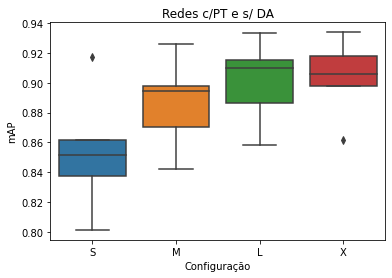

In [ ]:
ax = sns.boxplot(data=[df_sw["mAP"], df_mw["mAP"], df_lw["mAP"], df_xw["mAP"]])
ax.set_xticklabels(["S", "M", "L", "X"])
ax.set(xlabel="Configuração", ylabel="mAP")
ax.set_title("Redes c/PT e s/ DA")
plt.show()

In [ ]:
# ax = sns.boxplot(data=[df_sd["mAP"], df_md["mAP"], df_ld["mAP"], df_xd["mAP"]])
# ax.set_xticklabels(["S", "M", "L", "X"])
# ax.set(xlabel="Configuração", ylabel="mAP")
# ax.set_title("Redes s/PT e c/ DA")
# plt.show()

In [ ]:
# ax = sns.boxplot(data=[df_swd["mAP"], df_mwd["mAP"], df_lwd["mAP"], df_xwd["mAP"]])
# ax.set_xticklabels(["S", "M", "L", "X"])
# ax.set(xlabel="Configuração", ylabel="mAP")
# ax.set_title("Redes c/PT e c/ DA")
# plt.show()

###Catplot

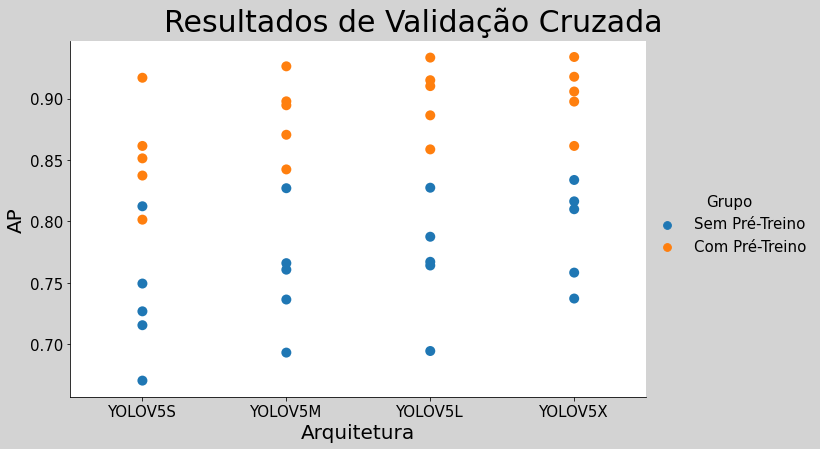

In [ ]:
import numpy as np
from matplotlib import rcParams

# figure size in inches
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 15
plt.rcParams["legend.title_fontsize"] = 15
plt.rcParams["figure.facecolor"] = 'lightgrey'

splits_mAP = pd.concat([df_s["mAP"], df_m["mAP"], df_l["mAP"], df_x["mAP"],
                        df_sw["mAP"], df_mw["mAP"], df_lw["mAP"], df_xw["mAP"]])
name = [["YOLOV5S"]*5, ["YOLOV5M"] * 5, ["YOLOV5L"] * 5, ["YOLOV5X"] * 5] * 2
name = np.reshape(name,len(name) * 5)
version = np.reshape([["Sem Pré-Treino"]*20, ["Com Pré-Treino"]*20], 40)

cross_val_splits = pd.DataFrame(data = {'AP': splits_mAP,
                          'Arquitetura':name,
                          'Grupo':version})


rp = sns.catplot(x="Arquitetura", y="AP", hue="Grupo", data=cross_val_splits, jitter=0, height=6, aspect=1.5, s=10)
rp.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
rp.fig.suptitle('Resultados de Validação Cruzada', fontsize=30)

plt.show()

In [ ]:
import numpy as np
from matplotlib import rcParams

# figure size in inches
plt.rcParams["axes.labelsize"] = 20
plt.rcParams["xtick.labelsize"] = 15
plt.rcParams["ytick.labelsize"] = 15
plt.rcParams["legend.fontsize"] = 15
plt.rcParams["legend.title_fontsize"] = 15
plt.rcParams["figure.facecolor"] = 'lightgrey'

splits_mAP = pd.concat([df_sd["mAP"], df_md["mAP"], df_ld["mAP"], df_xd["mAP"],
                        df_swd["mAP"], df_mwd["mAP"], df_lwd["mAP"], df_xwd["mAP"]])
name = [["YOLOV5S"]*5, ["YOLOV5M"] * 5, ["YOLOV5L"] * 5, ["YOLOV5X"] * 5] * 2
name = np.reshape(name,len(name) * 5)
version = np.reshape([["Sem Pré-Treino"]*20, ["Com Pré-Treino"]*20], 40)

cross_val_splits = pd.DataFrame(data = {'AP': splits_mAP,
                          'Arquitetura':name,
                          'Grupo':version})


rp = sns.catplot(x="Arquitetura", y="AP", hue="Grupo", data=cross_val_splits, jitter=0, height=6, aspect=1.5, s=10)
rp.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
rp.fig.suptitle('Resultados de Validação Cruzada', fontsize=30)

plt.show()

KeyError: ignored

##Tabela de Médias

In [ ]:
splits =[df_s, df_m, df_l, df_x,
         df_sw, df_mw, df_lw, df_xw]


splits_mean = pd.DataFrame()
for split in splits:
  splits_mean = splits_mean.append(split.mean(), ignore_index=True)

print(splits_mean[["P", "R", "mAP", "F1"]].to_string(index=False))
splits_mean["mAP"].idxmax()

       P        R      mAP        F1
 0.80886  0.71890  0.73488  0.761086
 0.82012  0.73838  0.75666  0.776552
 0.83020  0.74762  0.76812  0.786163
 0.84168  0.76832  0.79108  0.803004
 0.88944  0.82234  0.85366  0.854366
 0.91088  0.85390  0.88624  0.881328
 0.92386  0.86290  0.90064  0.892230
 0.92674  0.86940  0.90322  0.897058


7

#Avaliação Final

##Tabela com métricas

In [ ]:
df_final = pd.DataFrame()
indexes = []

for config in CONFIGS_LIST:
  try:
    results_path = '/content/gdrive/MyDrive/Nucleos/Retreino/v5' + config + '/results.txt'
    if not os.path.exists(results_path):
      results_path = results_path[:-3] + 'csv'
    aux = cria_df(results_path)
    
  except:
    continue
  idx = aux["Fit"].idxmax()
  indexes.append(idx)
  series = pd.Series(aux.iloc[idx, :].values, index=aux.columns)
  df_final = df_final.append(series, ignore_index=True)

df_final["Index"] = indexes
print(df_final[["P", "R", "mAP", "F1", "Index", "Fit"]].to_string(index=False))

       P        R      mAP        F1  Index       Fit
 0.82110  0.75500  0.76750  0.786664    199  0.332890
 0.84270  0.72690  0.75240  0.780528    199  0.318510
 0.87620  0.76070  0.80030  0.814375    174  0.351830
 0.86240  0.78320  0.81170  0.820894    196  0.370790
 0.90380  0.81840  0.86410  0.858983    168  0.415990
 0.90980  0.85480  0.88700  0.881443    169  0.440420
 0.92360  0.86280  0.89590  0.892165    170  0.461650
 0.91610  0.87320  0.89900  0.894136    194  0.461600
 0.91482  0.88748  0.90589  0.900943    165  0.463306
 0.91294  0.89063  0.90842  0.901647    115  0.469382
 0.91361  0.89490  0.91248  0.904158    128  0.476403
 0.92446  0.88934  0.91502  0.906560     83  0.478286
 0.91592  0.88644  0.90378  0.900939     42  0.465759
 0.91848  0.88882  0.90580  0.903407     55  0.473071
 0.92917  0.89259  0.91775  0.910513     23  0.474869
 0.92262  0.89368  0.91642  0.907919     23  0.480541


##Loss, mAP e gráficos diversos

In [ ]:
df_list = []

for config in CONFIGS_LIST:
  try:
    results_path = '/content/gdrive/MyDrive/Nucleos/Retreino/v5' + config + '/results.txt'
    if not os.path.exists(results_path):
      results_path = results_path[:-3] + 'csv'
    aux = cria_df(results_path)
    df_list.append(aux)
  except:
    continue

###Cenário 1

####Loss

In [ ]:
idx1_min = df_final["Fit"][0:8].idxmin()
idx1_max = df_final["Fit"][0:8].idxmax()
train_loss = df_list[idx1_max]["box"] + df_list[idx1_max]["obj"]
test_loss = df_list[idx1_max]["vbox"] + df_list[idx1_max]["vobj"]
loss_sub = train_loss - test_loss
print('Loss teste maior que treino: ', loss_sub[loss_sub<0])
print('Menor diferença absoluta ', loss_sub[loss_sub>0].min(), ' na época', loss_sub[loss_sub>0].idxmin())
print('Ponto de mínimo de treino: ', train_loss.idxmin(), ' Ponto de mínimo de teste: ', test_loss.idxmin())

Loss teste maior que treino:  Series([], dtype: float64)
Menor diferença absoluta  0.02531  na época 12
Ponto de mínimo de treino:  12  Ponto de mínimo de teste:  9


In [ ]:
train_loss = df_list[idx1_min]["box"] + df_list[idx1_min]["obj"]
test_loss = df_list[idx1_min]["vbox"] + df_list[idx1_min]["vobj"]
loss_sub = train_loss - test_loss
print('Loss teste maior que treino: ', loss_sub[loss_sub<0], '\n')
print('Menor diferença absoluta ', loss_sub[loss_sub>0].min(), ' na época', loss_sub[loss_sub>0].idxmin())
print('Ponto de mínimo de treino: ', train_loss.idxmin(), ' Ponto de mínimo de teste: ', test_loss.idxmin())

Loss teste maior que treino:  26   -0.03731
28   -0.01612
50   -0.05237
52   -0.01159
53   -0.06550
54   -0.04506
55   -0.03266
56   -0.02398
dtype: float64 

Menor diferença absoluta  0.005479999999999985  na época 5
Ponto de mínimo de treino:  22  Ponto de mínimo de teste:  22


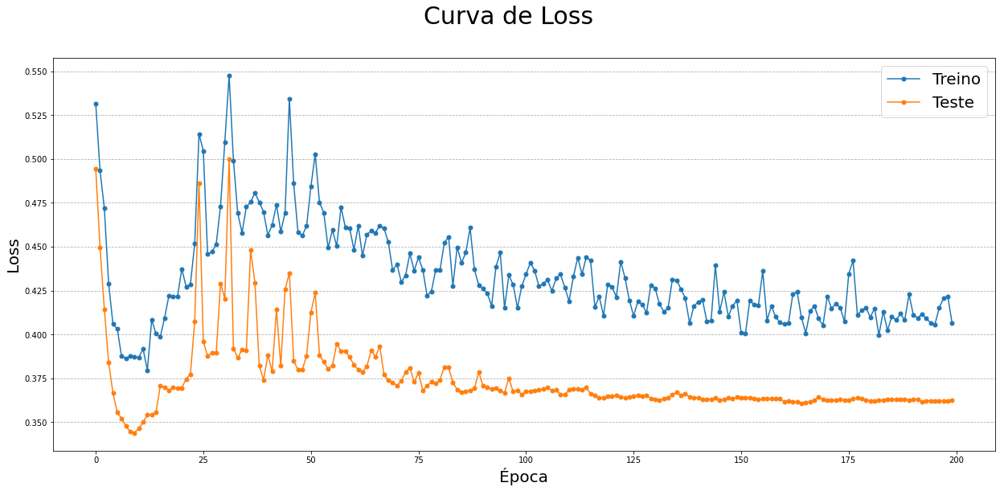

In [ ]:
plot_loss(df_list[idx1_max])

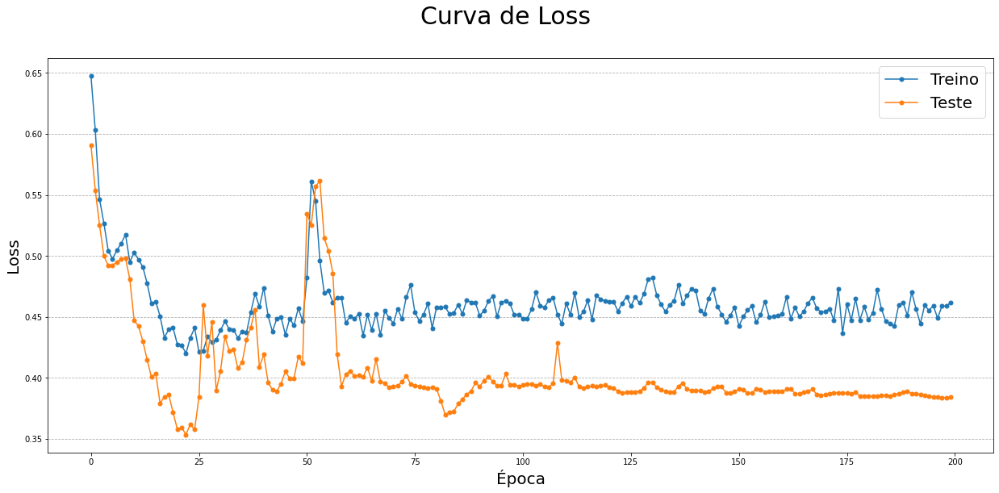

In [ ]:
plot_loss(df_list[idx1_min])

####Curva de mAP

In [ ]:
print('Índice Máximo: ',(idx1_max, CONFIGS_LIST[idx1_max]), '\nÍndice Mínimo: ', (idx1_min, CONFIGS_LIST[idx1_min]))
subs_map = df_list[idx1_max]["mAP"]-(df_list[idx1_min]["mAP"])
subs_map[subs_map<0]

Índice Máximo:  (6, 'lwr') 
Índice Mínimo:  (1, 'mr')


42   -0.1163
Name: mAP, dtype: float64

In [ ]:
print(df_list[idx1_max]["mAP"].max(), df_list[idx1_max]["mAP"].idxmax())

0.8995 155


In [ ]:
print(df_list[idx1_min]["mAP"].max(), df_list[idx1_min]["mAP"].idxmax())

0.7524 199


In [ ]:
import numpy as np

melhor_pior_map = df_list[idx1_max]["mAP"]/(df_list[idx1_min]["mAP"])
melhor_pior_map.replace([np.inf, -np.inf], np.nan, inplace=True)
(melhor_pior_map.max(), melhor_pior_map.idxmax())

(117.06170421155731, 50)

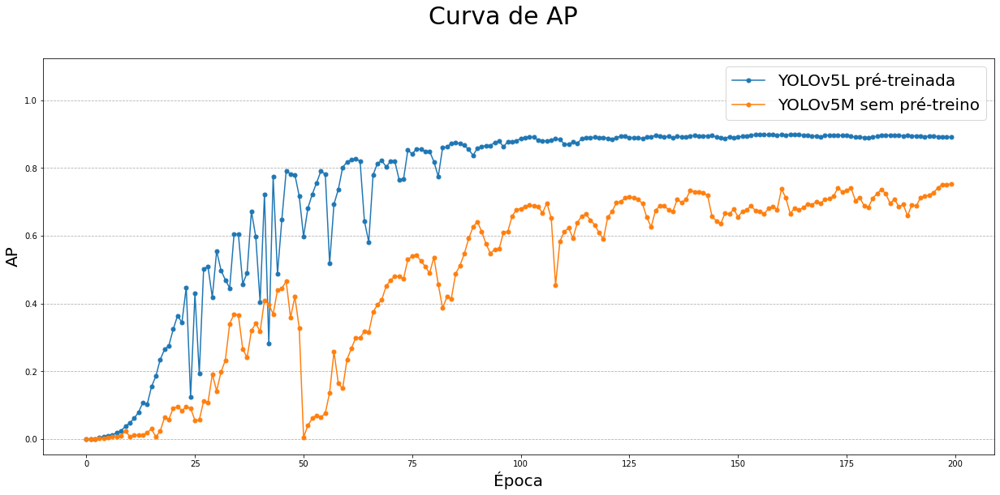

In [ ]:
plot_map(df_list[idx1_max], df_list[idx1_min], ylim=True,
         legends=["YOLOv5L pré-treinada", "YOLOv5M sem pré-treino"])

####Gráficos

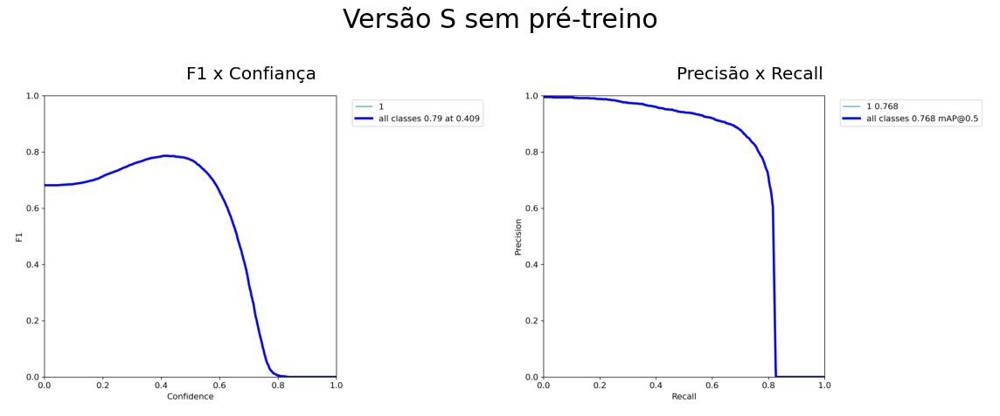

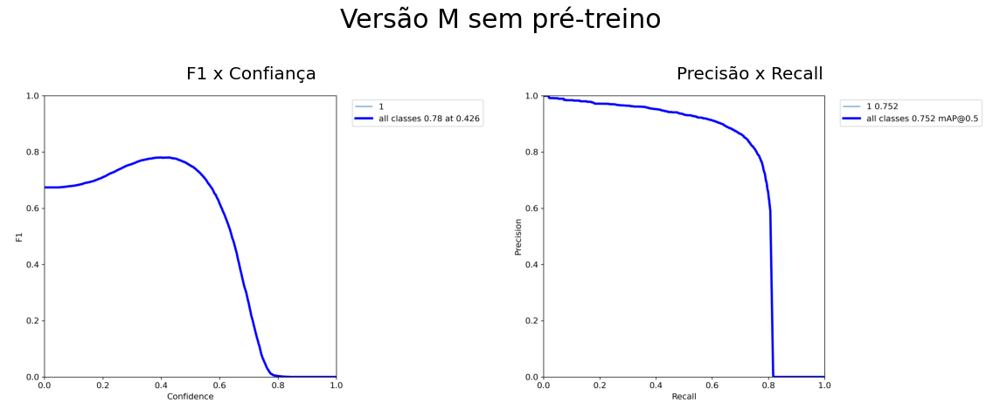

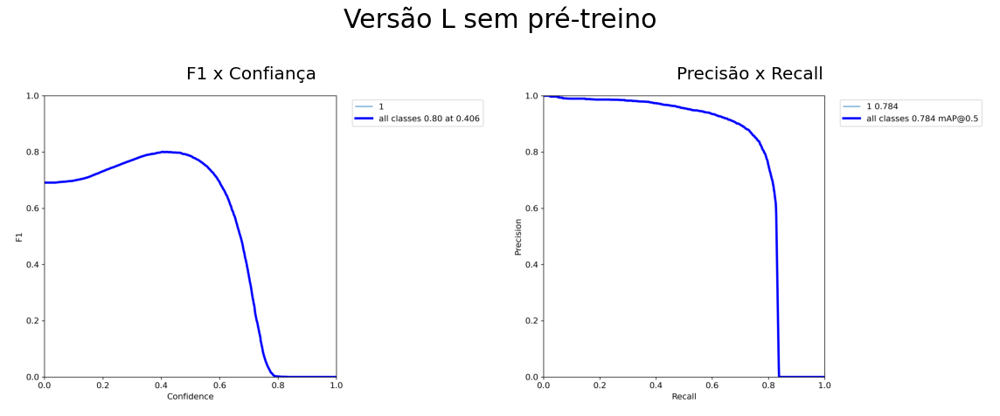

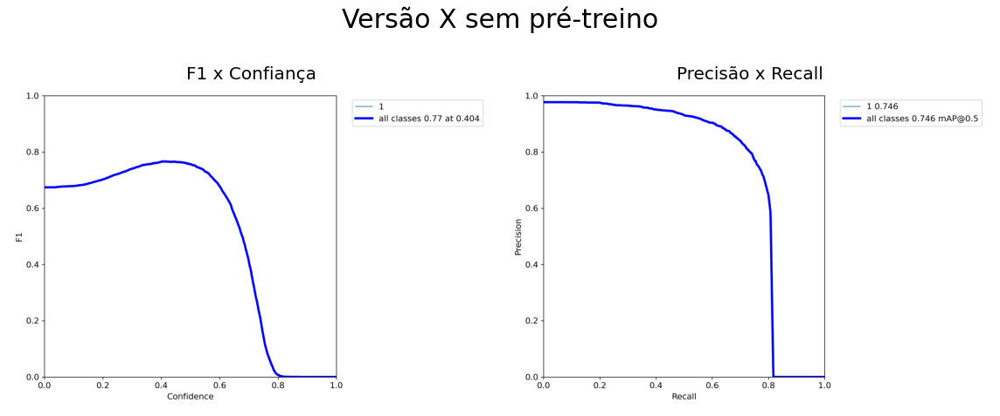

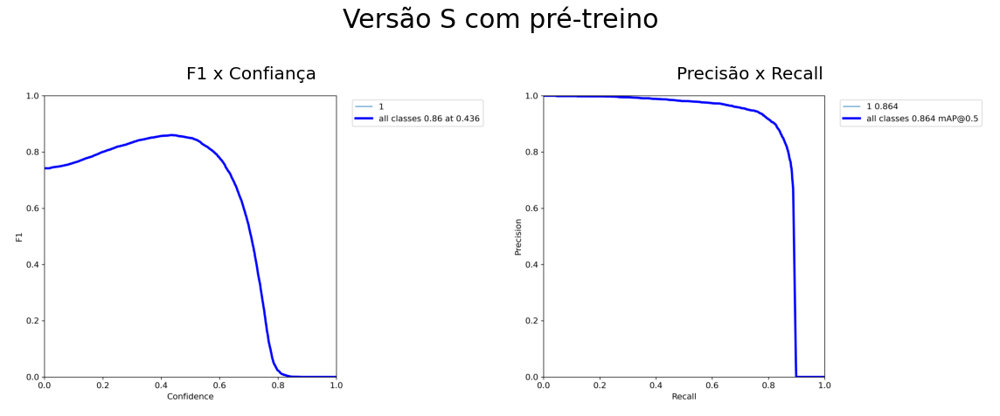

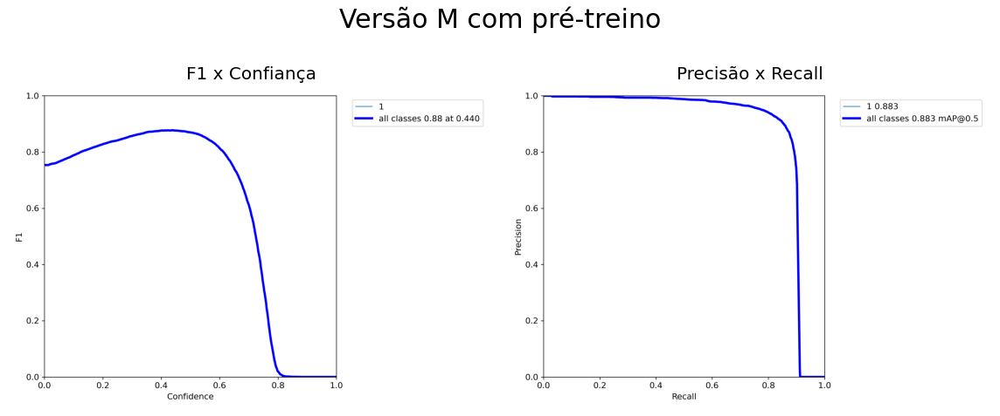

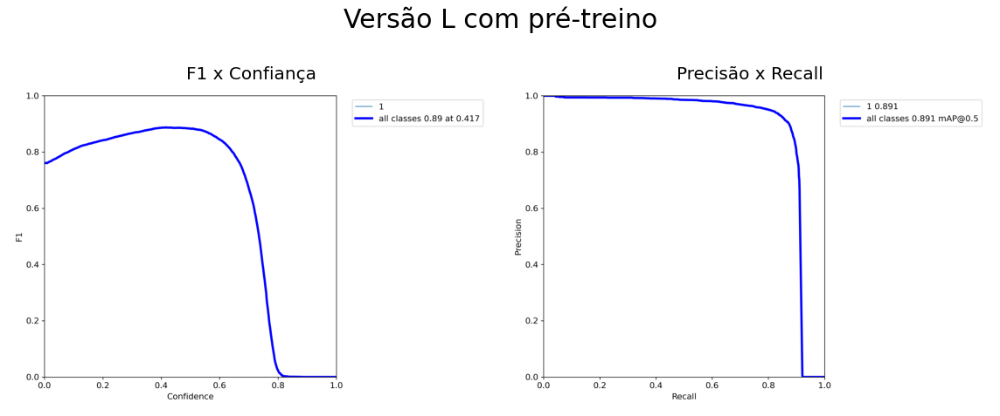

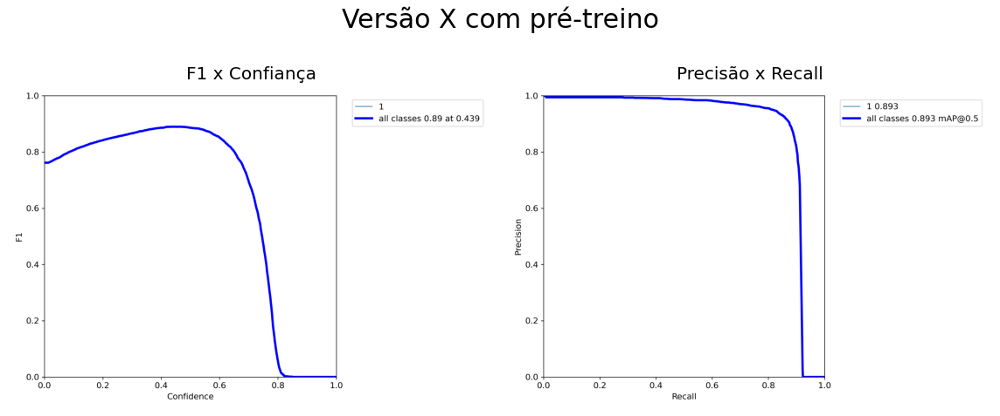

In [ ]:
show_results(isDataAug=False)

###Cenário 2

####Loss

In [ ]:
idx2_min = df_final["Fit"][8:16].idxmin()
idx2_max = df_final["Fit"][8:16].idxmax()
train_loss = df_list[idx2_max]["box"] + df_list[idx2_max]["obj"]
test_loss = df_list[idx2_max]["vbox"] + df_list[idx2_max]["vobj"]
loss_sub = train_loss - test_loss
print('Loss de teste mínimo na época: ', test_loss.idxmin())
print('Loss teste maior que treino: ', len(loss_sub[loss_sub<0]), '\n')
print('Menor diferença absoluta ', loss_sub[loss_sub>0].min(), ' na época', loss_sub[loss_sub>0].idxmin())

Loss de teste mínimo na época:  18
Loss teste maior que treino:  129 

Menor diferença absoluta  0.000128000000000017  na época 71


In [ ]:
train_loss = df_list[idx2_min]["box"] + df_list[idx2_min]["obj"]
test_loss = df_list[idx2_min]["vbox"] + df_list[idx2_min]["vobj"]
loss_sub = train_loss - test_loss
print('Loss de teste mínimo na época: ', test_loss.idxmin())
print('Loss teste maior que treino: ', loss_sub[loss_sub<0], '\n')
print('Menor diferença absoluta ', loss_sub[loss_sub>0].min(), ' na época', loss_sub[loss_sub>0].idxmin())

Loss de teste mínimo na época:  75
Loss teste maior que treino:  Series([], dtype: float64) 

Menor diferença absoluta  0.024049000000000043  na época 192


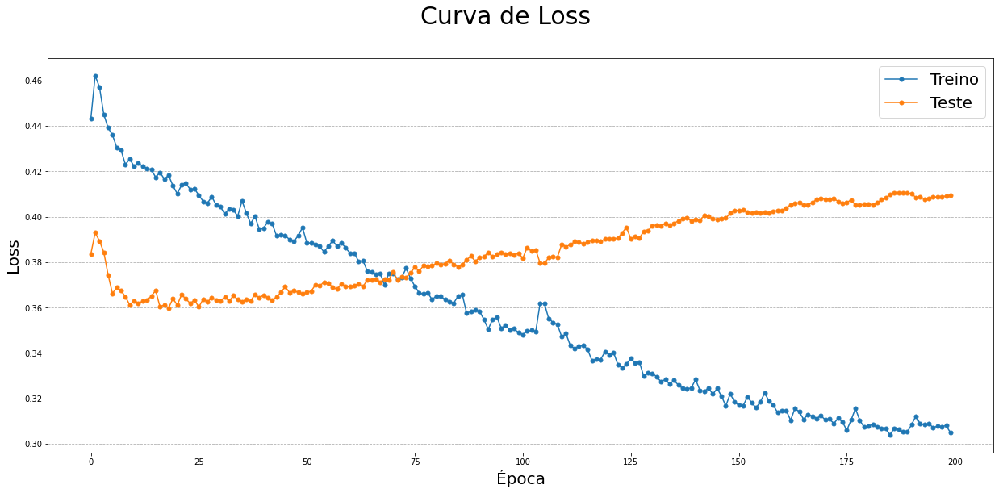

In [ ]:
plot_loss(df_list[idx2_max])

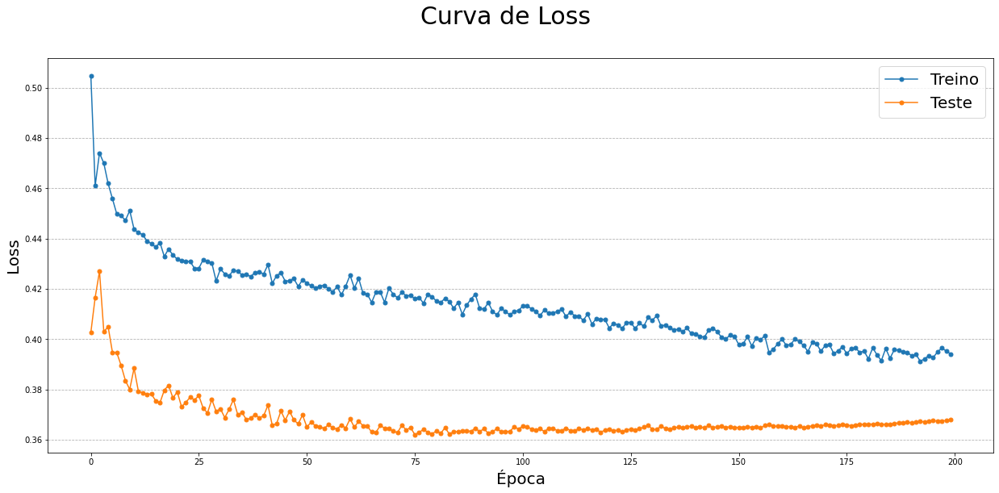

In [ ]:
plot_loss(df_list[idx2_min])

####Curva de mAP

In [ ]:
print('Índice Máximo: ',(idx2_max, CONFIGS_LIST[idx2_max]), '\nÍndice Mínimo: ', (idx2_min, CONFIGS_LIST[idx2_min]))

Índice Máximo:  (15, 'xwdr') 
Índice Mínimo:  (8, 'sdr')


In [ ]:
print(df_list[idx2_max]["mAP"].max(), df_list[idx2_max]["mAP"].idxmax())

0.9169700000000001 18


In [ ]:
print(df_list[idx2_min]["mAP"].max(), df_list[idx2_min]["mAP"].idxmax())

0.90701 125


In [ ]:
import numpy as np

melhor_pior_map = df_list[idx2_max]["mAP"]/(df_list[idx2_min]["mAP"])
melhor_pior_map.replace([np.inf, -np.inf], np.nan, inplace=True)
(melhor_pior_map.max(), melhor_pior_map.idxmax())

(3.64534262485482, 0)

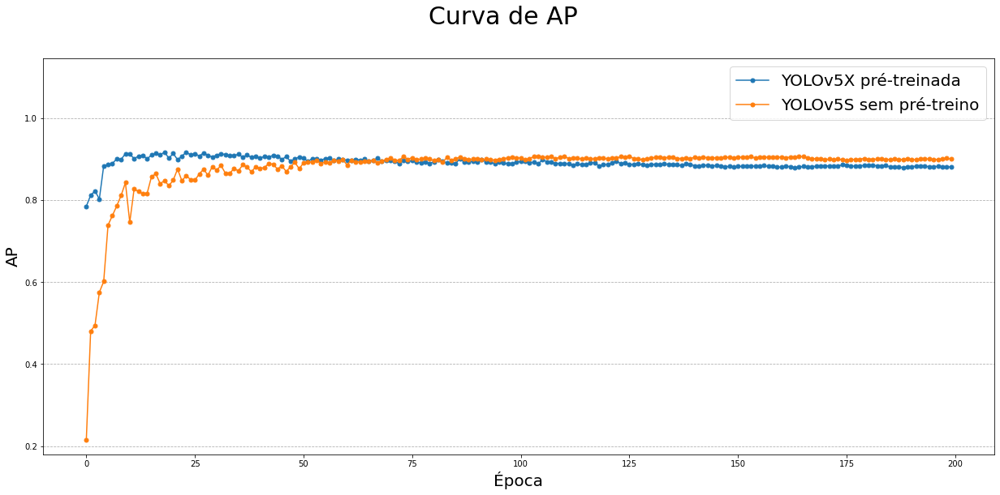

In [ ]:
plot_map(df_list[idx2_max], df_list[idx2_min], ylim=True,
         legends=["YOLOv5X pré-treinada", "YOLOv5S sem pré-treino"])

####Gráficos

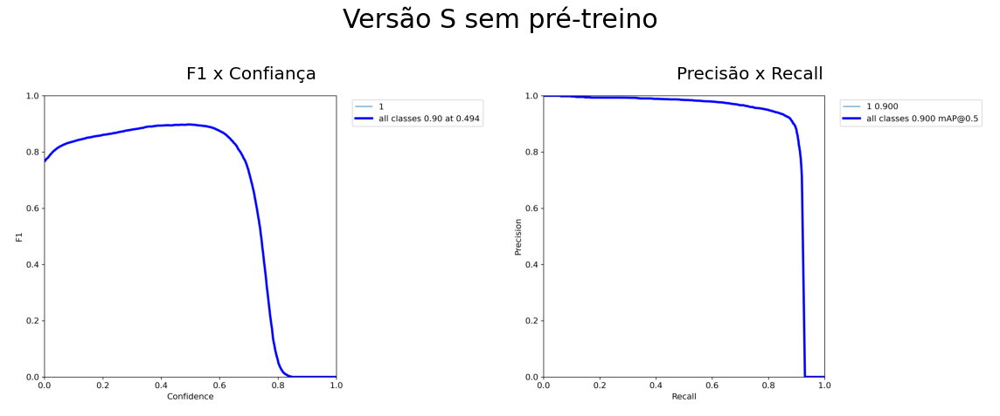

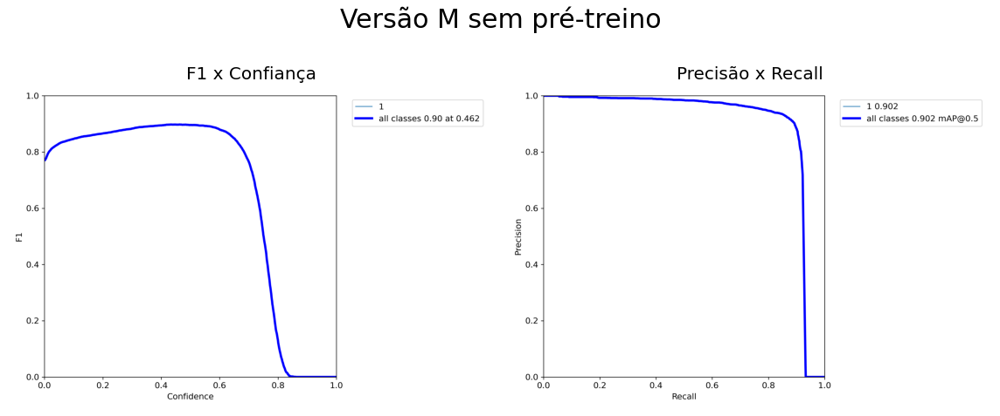

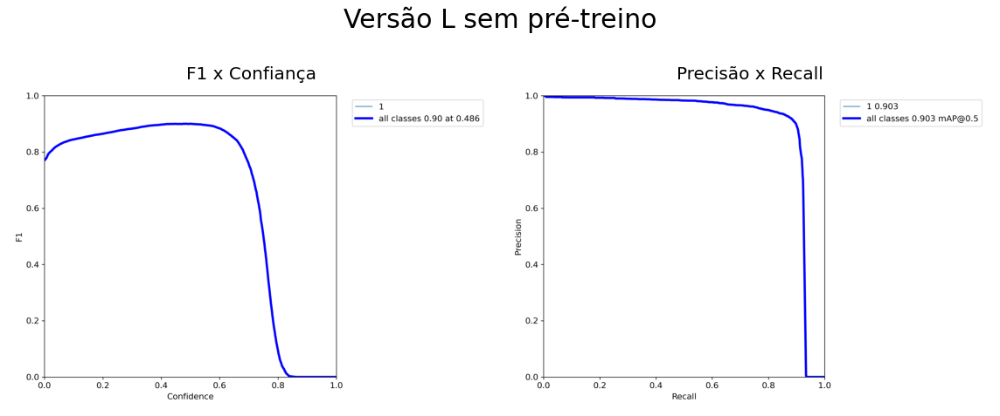

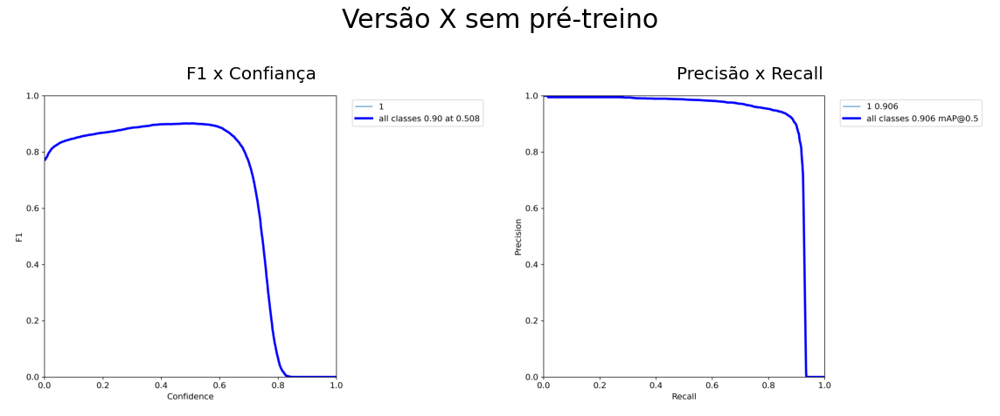

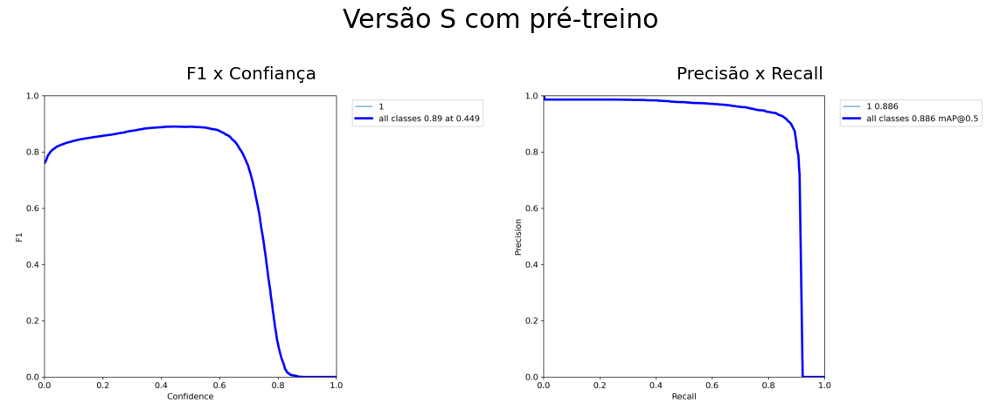

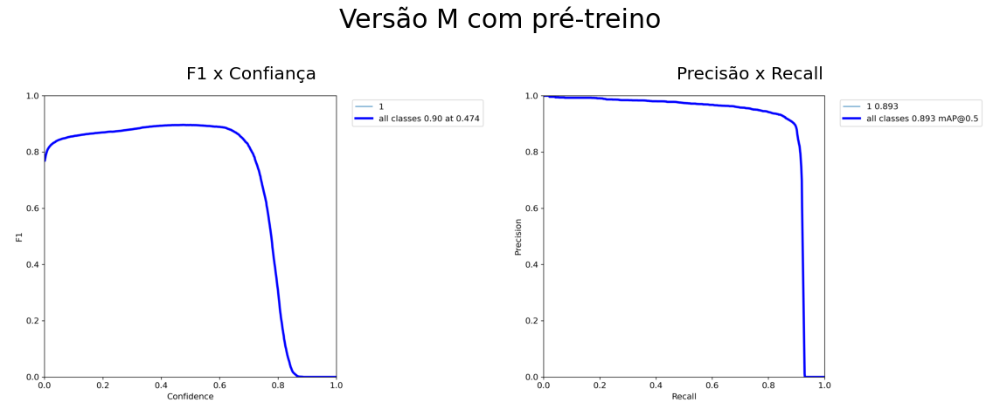

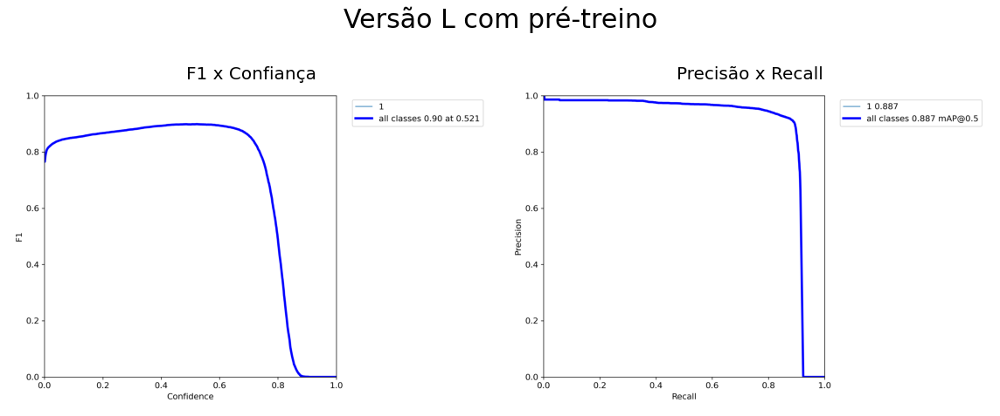

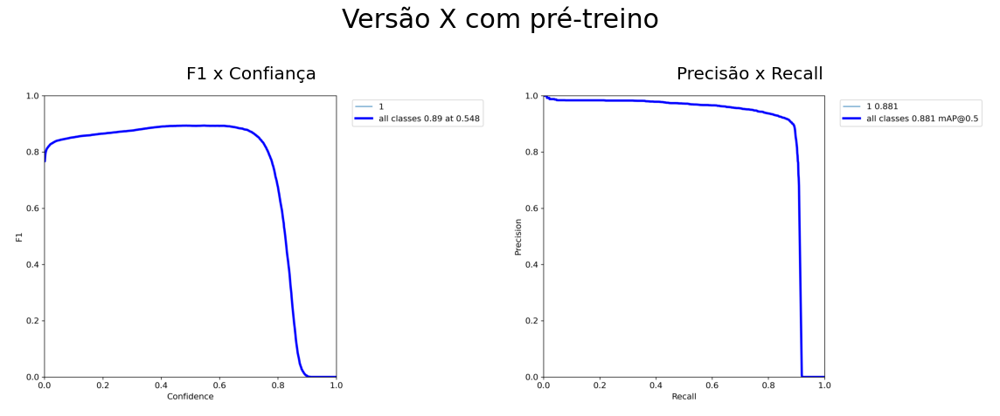

In [ ]:
show_results(isDataAug=True)

#Comparação entre as marcações da rede e as anotações

##Preparações iniciais




In [ ]:
# clone YOLOv5 repository
# %%capture
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 886f1c03d839575afecb059accf74296fad395b6

Cloning into 'yolov5'...
remote: Enumerating objects: 9484, done.
remote: Counting objects: 100% (11/11), done.
remote: Compressing objects: 100% (10/10), done.
remote: Total 9484 (delta 2), reused 7 (delta 1), pack-reused 9473
Receiving objects: 100% (9484/9484), 9.94 MiB | 19.99 MiB/s, done.
Resolving deltas: 100% (6585/6585), done.
/content/yolov5/yolov5
HEAD is now at 886f1c0 DDP after autoanchor reorder (#2421)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.9.0+cu102 CPU


In [ ]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/data.yaml

val: /content/yolov5/test_images

nc: 1
names: ['1']

In [ ]:
%cp /content/gdrive/MyDrive/test.py /content/yolov5
%cp /content/gdrive/MyDrive/detect.py /content/yolov5

In [ ]:
%cd
%cd /content/yolov5
%rm -rf test_images

/root
/content/yolov5


##Grid de Imagens

In [ ]:
weights_src = "/content/gdrive/MyDrive/Nucleos/Retreino/"
path_to_files = "/content/gdrive/MyDrive/Nucleos/Datasets/original/test/images"
file_path = os.path.join(path_to_files, random.choice(os.listdir(path_to_files)))


for dir in os.listdir(weights_src):
  config = dir.split("v5")[1]
  weight_path = weights_src + dir + "/weights/best.pt"
  if os.path.exists(weight_path):
    %cd /content/yolov5/ 
    !python detect.py --weights $weight_path --img 416 --source $file_path --name $config 

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='mwr', project='runs/detect', save_conf=False, save_txt=False, source='/content/gdrive/MyDrive/Nucleos/Datasets/original/test/images/n101_jpg.rf.191a7d81f96a0b7339432be62f31f804.jpg', update=False, view_img=False, weights=['/content/gdrive/MyDrive/Nucleos/Retreino/v5mwr/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CPU

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 308 layers, 21037638 parameters, 0 gradients, 50.3 GFLOPS
image 1/1 /co

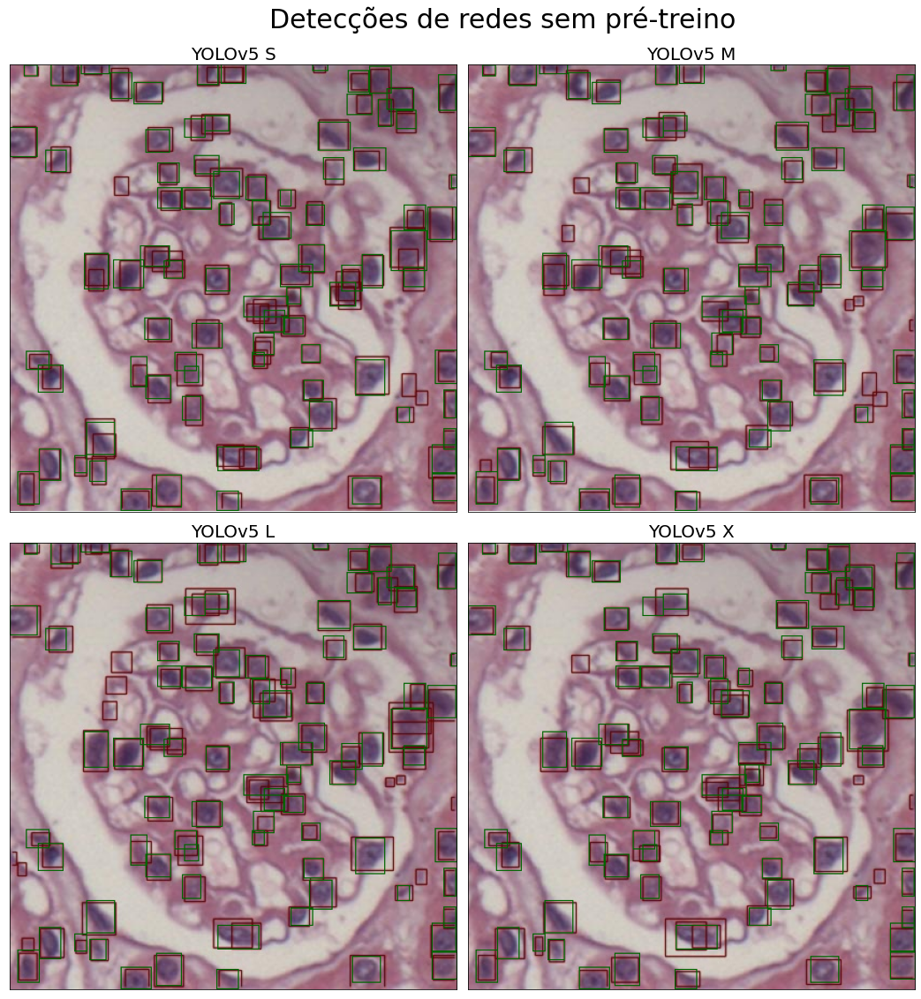

In [ ]:
list_c1a = ["sr", "mr", "lr", "xr"]
list_c1b = ["swr", "mwr", "lwr", "xwr"]
list_c2a = ["lr", "lwr", "ldr", "lwdr"]
list_c2b = ["xr", "xwr", "xdr", "xwdr"]

compare_detections(list_c1a, title="Detecções de redes sem pré-treino")

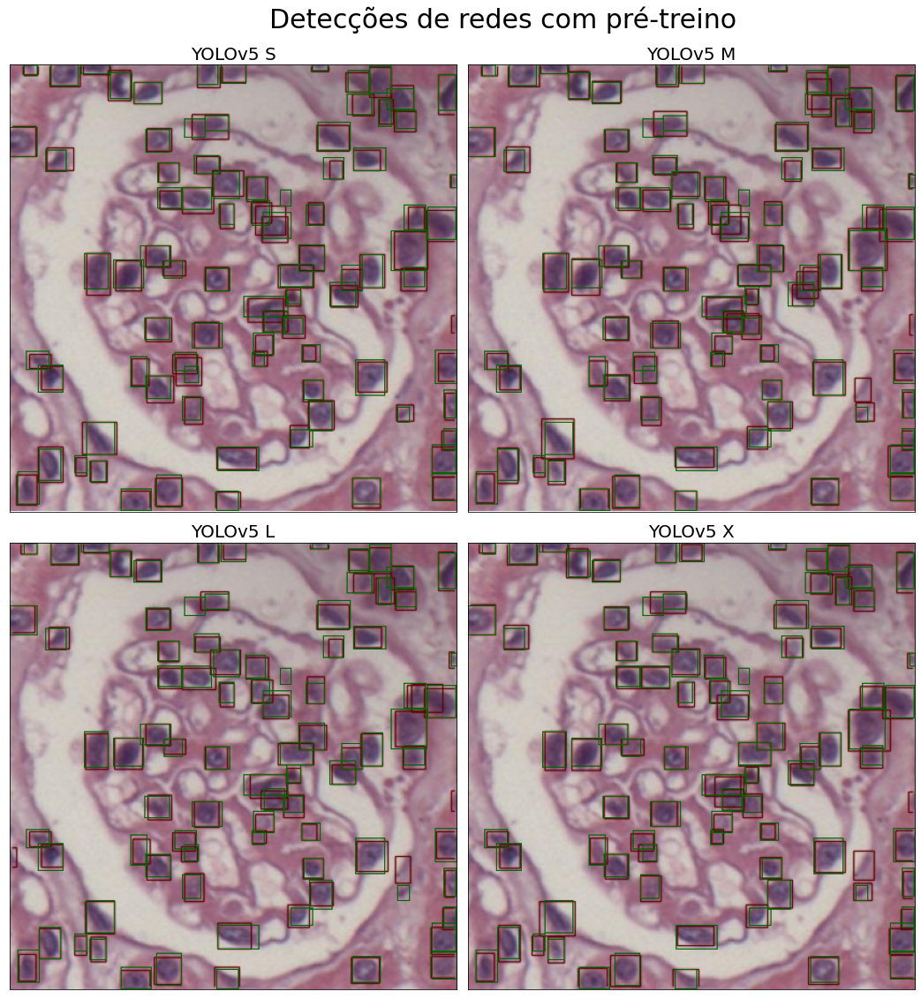

In [ ]:
compare_detections(list_c1b, title="Detecções de redes com pré-treino")

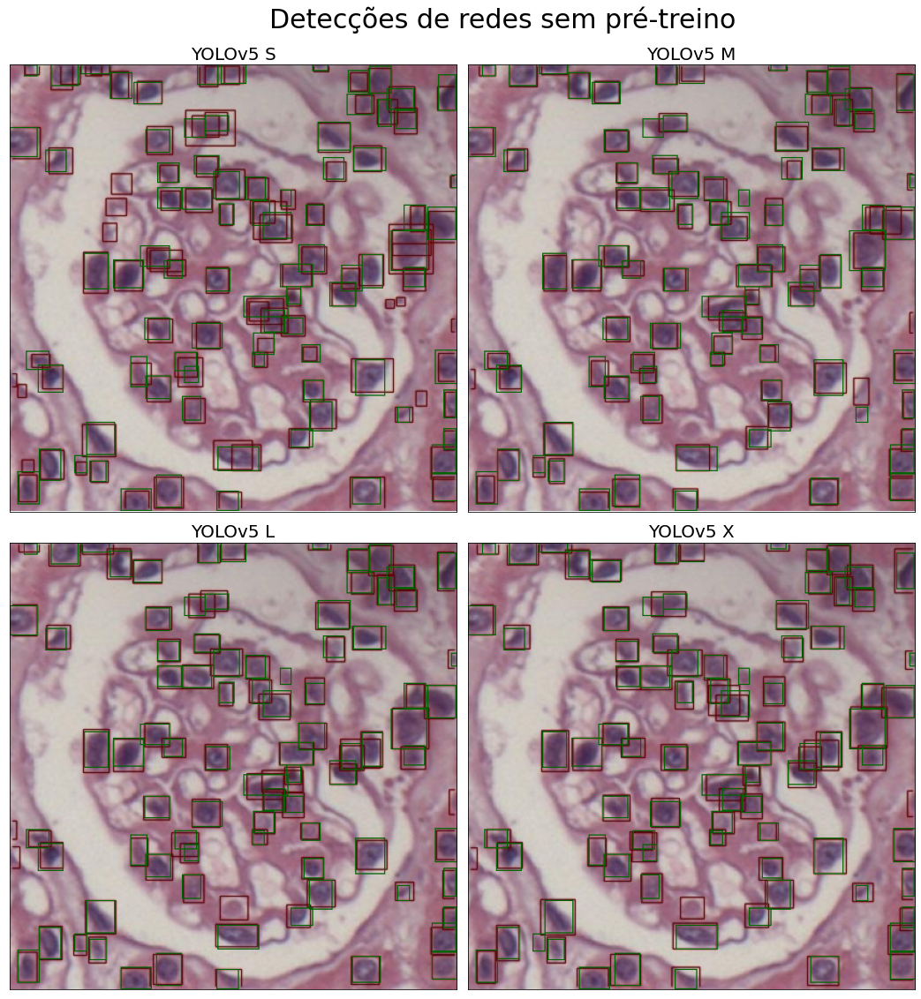

In [ ]:
compare_detections(list_c2a, title="Detecções de redes sem pré-treino")

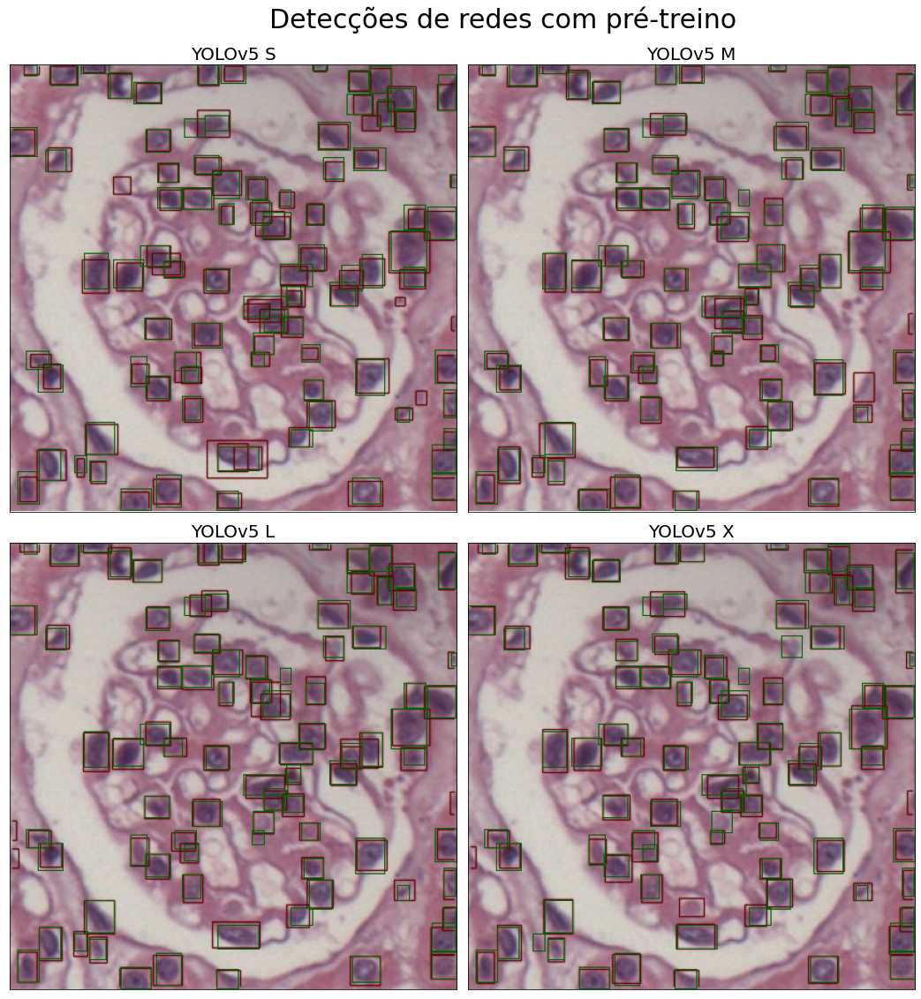

In [ ]:
compare_detections(list_c2b, title="Detecções de redes com pré-treino")

##Cenário 1

####Imagem Padrão

In [ ]:
print(idx1_max, CONFIGS_LIST[idx1_max])
print(idx1_min, CONFIGS_LIST[idx1_min])

NameError: ignored

In [ ]:
os.mkdir('test_images')
os.mkdir('test_images/images')
os.mkdir('test_images/labels')
%cp "/content/gdrive/MyDrive/Nucleos/Datasets/original/test/images/n24_jpg.rf.78bdf881709e44f5ea072feb9813eace.jpg" ./test_images/images
%cp "/content/gdrive/MyDrive/Nucleos/Datasets/original/test/labels/n24_jpg.rf.78bdf881709e44f5ea072feb9813eace.txt" ./test_images/labels

In [ ]:
best_weight = "/content/gdrive/MyDrive/Podocitos/Retreino/v5" + CONFIGS_LIST[idx1_max] + "/weights/best.pt"
worst_weight = "/content/gdrive/MyDrive/Podocitos/Retreino/v5" + CONFIGS_LIST[idx1_min] + "/weights/best.pt"
filename = "/content/gdrive/MyDrive/Nucleos/Datasets/original/test/images/n24_jpg.rf.78bdf881709e44f5ea072feb9813eace.jpg"

%cd /content/yolov5/ 
!python detect.py --weights $best_weight --img 416 --source $filename --name c1a
!python detect.py --weights $worst_weight --img 416 --source $filename --name c1b

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='c1a', project='runs/detect', save_conf=False, save_txt=False, source='/content/gdrive/MyDrive/Nucleos/Datasets/original/test/images/n24_jpg.rf.78bdf881709e44f5ea072feb9813eace.jpg', update=False, view_img=False, weights=['/content/gdrive/MyDrive/Podocitos/Retreino/v5lwr/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CPU

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 392 layers, 46600566 parameters, 0 gradients, 114.1 GFLOPS
image 1/1 /

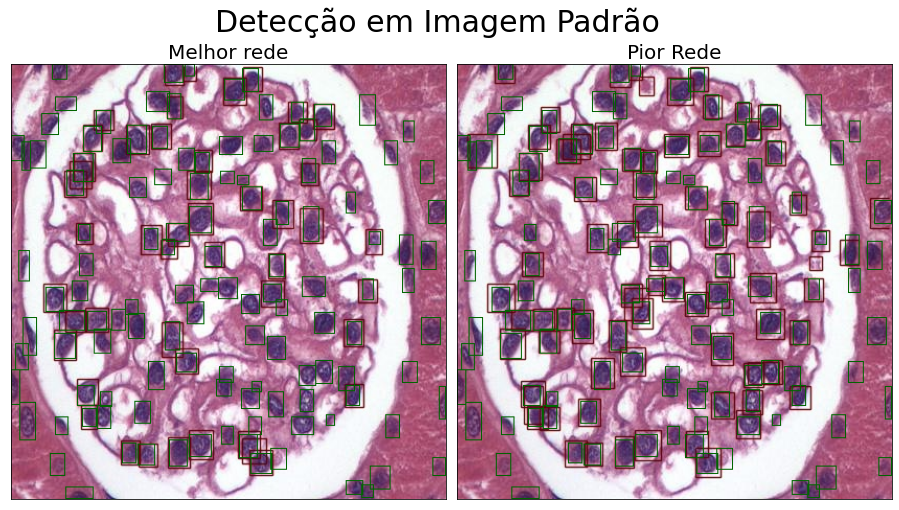

In [ ]:
compara_redes([DETECTION_SRC+"c1a", DETECTION_SRC+"c1b"], 
              "Detecção em Imagem Padrão",
              set_title=["Melhor rede", "Pior Rede"])

####Comparação entre a melhor e a pior imagem

In [ ]:
items = ["v5" + item for item in CONFIGS_LIST]
%cd /content/yolov5
best_worst(items)

/content/yolov5
Namespace(augment=False, batch_size=32, conf_thres=0.001, data='/content/data.yaml', device='', exist_ok=False, img_size=416, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['/content/gdrive/MyDrive/Nucleos/Retreino/v5sr/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CPU

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 224 layers, 7053910 parameters, 0 gradients, 16.3 GFLOPS
val: Scanning '/content/yolov5/test_images/labels' for images and labels... 1 f

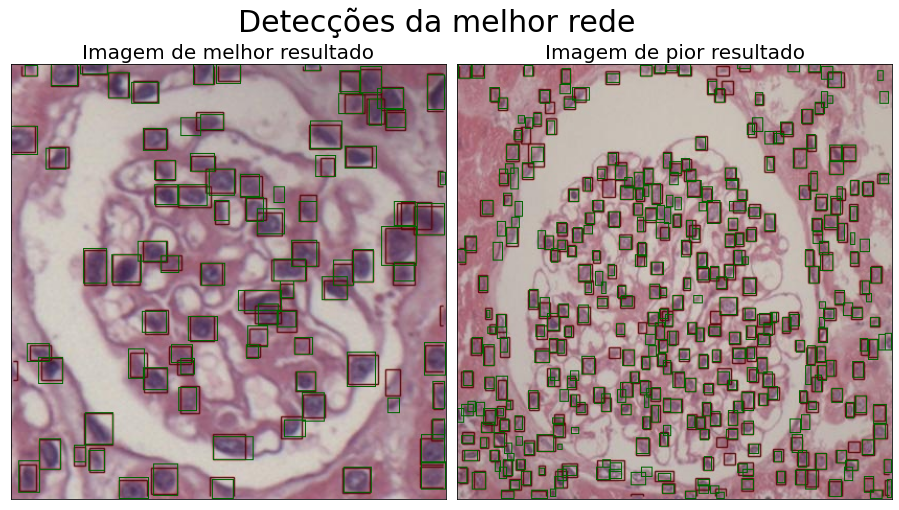

In [ ]:
best_path = "/content/yolov5/runs/detect/v5" + CONFIGS_LIST[idx1_max] + "b"
worst_path = "/content/yolov5/runs/detect/v5" + CONFIGS_LIST[idx1_max] + "w"
compara_redes([best_path, worst_path], "Detecções da melhor rede",
              set_title=["Imagem de melhor resultado", "Imagem de pior resultado"])

##Cenário 2

####Imagem padrão

In [ ]:
print(idx2_max, CONFIGS_LIST[idx2_max])
print(idx2_min, CONFIGS_LIST[idx2_min])

15 xwdr
8 sdr


In [ ]:
best_weight = "/content/gdrive/MyDrive/Podocitos/Retreino/v5" + CONFIGS_LIST[idx2_max] + "/weights/best.pt"
worst_weight = "/content/gdrive/MyDrive/Podocitos/Retreino/v5" + CONFIGS_LIST[idx2_min] + "/weights/best.pt"
filename = "/content/gdrive/MyDrive/Nucleos/Datasets/original/test/images/n24_jpg.rf.78bdf881709e44f5ea072feb9813eace.jpg"

%cd /content/yolov5/ 
!python detect.py --weights $best_weight --img 416 --source $filename --name c2a
!python detect.py --weights $worst_weight --img 416 --source $filename --name c2b

/content/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='c2a', project='runs/detect', save_conf=False, save_txt=False, source='/content/gdrive/MyDrive/Nucleos/Datasets/original/test/images/n24_jpg.rf.78bdf881709e44f5ea072feb9813eace.jpg', update=False, view_img=False, weights=['/content/gdrive/MyDrive/Podocitos/Retreino/v5xwdr/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CPU

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
Model Summary: 476 layers, 87198694 parameters, 0 gradients, 217.1 GFLOPS
image 1/1 

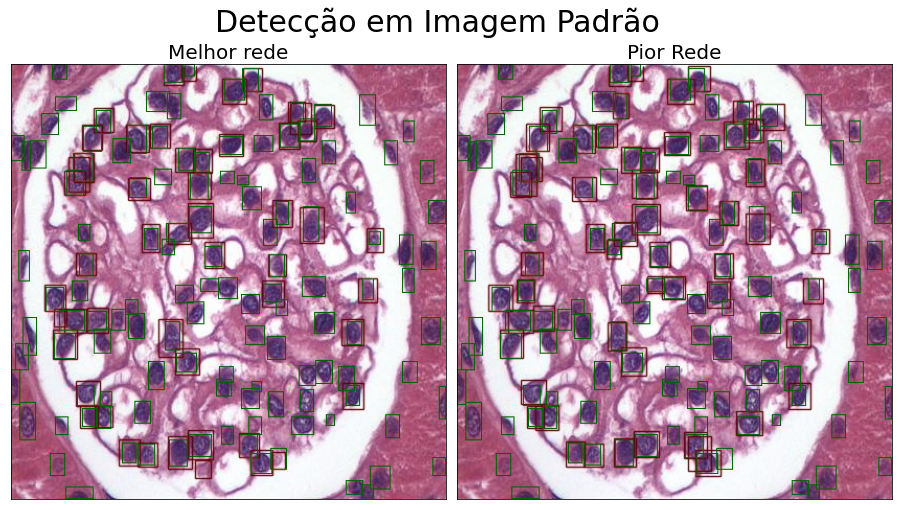

In [ ]:

compara_redes([DETECTION_SRC+"c2a", DETECTION_SRC+"c2b"], 
              "Detecção em Imagem Padrão",
              set_title=["Melhor rede", "Pior Rede"])

####Comparação entre a melhor e a pior imagem

In [ ]:
items = ["v5" + item for item in CONFIGS_LIST]
%cd /content/yolov5
best_worst(items)

/content/yolov5
Configurations  v5sr  already stored
Configurations  v5mr  already stored
Configurations  v5lr  already stored
Configurations  v5xr  already stored
Configurations  v5swr  already stored
Configurations  v5mwr  already stored
Configurations  v5lwr  already stored
Configurations  v5xwr  already stored
Namespace(augment=False, batch_size=32, conf_thres=0.001, data='/content/data.yaml', device='', exist_ok=False, img_size=416, iou_thres=0.6, name='exp', project='runs/test', save_conf=False, save_hybrid=False, save_json=False, save_txt=False, single_cls=False, task='val', verbose=False, weights=['/content/gdrive/MyDrive/Nucleos/Retreino/v5sdr/weights/best.pt'])
YOLOv5 v4.0-126-g886f1c0 torch 1.9.0+cu102 CPU

Fusing layers... 
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable

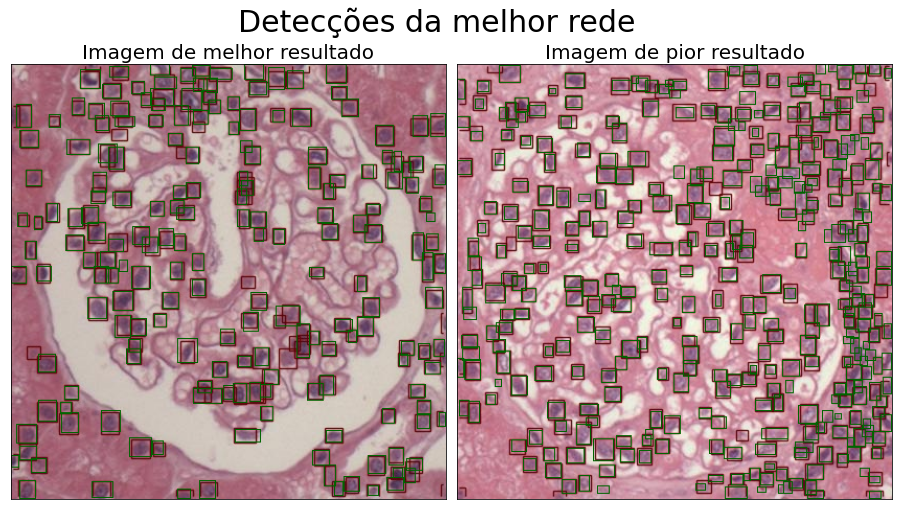

In [ ]:
best_path = "/content/yolov5/runs/detect/v5" + CONFIGS_LIST[idx2_max] + "b"
worst_path = "/content/yolov5/runs/detect/v5" + CONFIGS_LIST[idx2_max] + "w"
compara_redes([best_path, worst_path], "Detecções da melhor rede",
              set_title=["Imagem de melhor resultado", "Imagem de pior resultado"])

#Rascunho

##Gráficos de barra

In [ ]:
df_final[0:8]["Fit"].sort_values()

1    0.31851
0    0.33289
2    0.35183
3    0.37079
4    0.41599
5    0.44042
7    0.46160
6    0.46165
Name: Fit, dtype: float64

In [ ]:
df_final[8:16]["Fit"].sort_values()

8     0.463306
12    0.465759
9     0.469382
13    0.473071
14    0.474869
10    0.476403
11    0.478286
15    0.480541
Name: Fit, dtype: float64

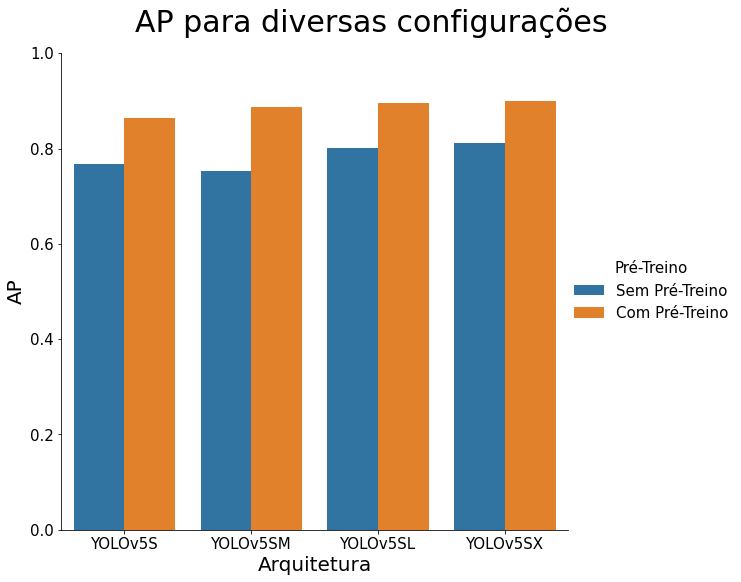

In [ ]:
AP = df_final["mAP"]
pre_train = np.reshape([[["Sem Pré-Treino"]*4, ["Com Pré-Treino"]*4]]*2, 16)
data_aug = np.reshape([["Sem DA"]*8, ["Com DA"]*8], 16)
ap_nucleos = pd.DataFrame(data = {
                          'AP': AP,
                          'Arquitetura':np.reshape([["YOLOv5S", "YOLOv5SM", "YOLOv5SL", "YOLOv5SX"]*4], 16),
                          'Pré-Treino':pre_train,
                          'Data Augmentation':data_aug})

plt.rcParams["legend.fontsize"] = 15
plt.rcParams["legend.title_fontsize"] = 15
rp = sns.catplot(x="Arquitetura", y="AP", hue="Pré-Treino", kind="bar", data=ap_nucleos[0:8], height=8)
rp.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
rp.fig.suptitle('AP para diversas configurações', fontsize=30)
rp.set_xlabels(fontsize=20)
rp.set_ylabels(fontsize=20)
rp.set_xticklabels(fontsize=15)
rp.set_yticklabels(fontsize=15)
plt.show()

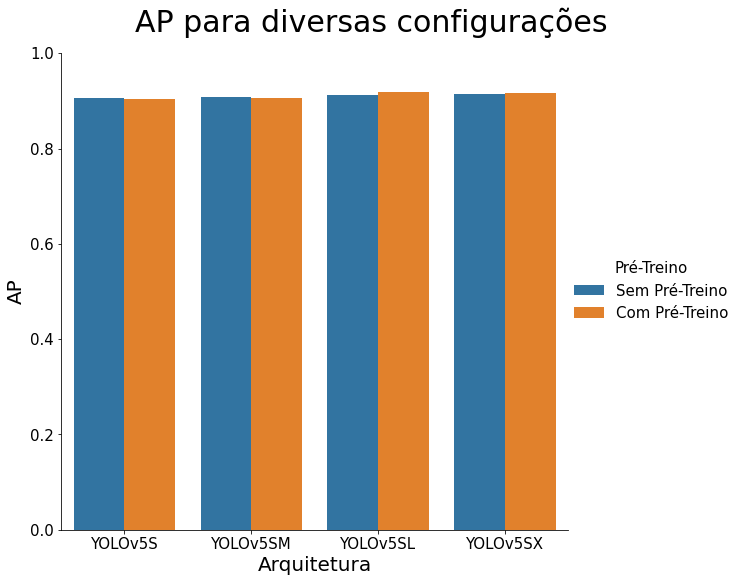

In [ ]:
rp = sns.catplot(x="Arquitetura", y="AP", hue="Pré-Treino", kind="bar", data=ap_nucleos[8:16], height=8)
rp.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
rp.fig.suptitle('AP para diversas configurações', fontsize=30)
rp.set_xlabels(fontsize=20)
rp.set_ylabels(fontsize=20)
rp.set_xticklabels(fontsize=15)
rp.set_yticklabels(fontsize=15)
plt.show()

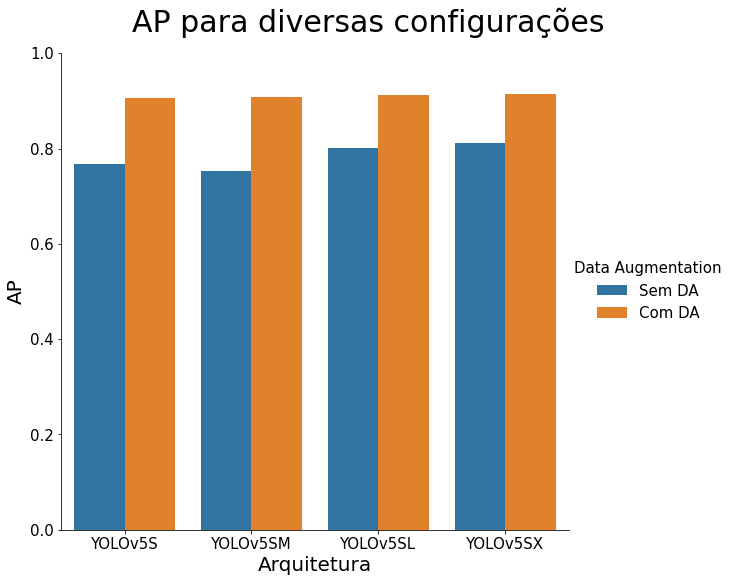

In [ ]:
rp = sns.catplot(x="Arquitetura", y="AP", hue="Data Augmentation", kind="bar", data=ap_nucleos.iloc[np.r_[0:4, 8:12]], height=8)
rp.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
rp.fig.suptitle('AP para diversas configurações', fontsize=30)
rp.set_xlabels(fontsize=20)
rp.set_ylabels(fontsize=20)
rp.set_xticklabels(fontsize=15)
rp.set_yticklabels(fontsize=15)
plt.show()

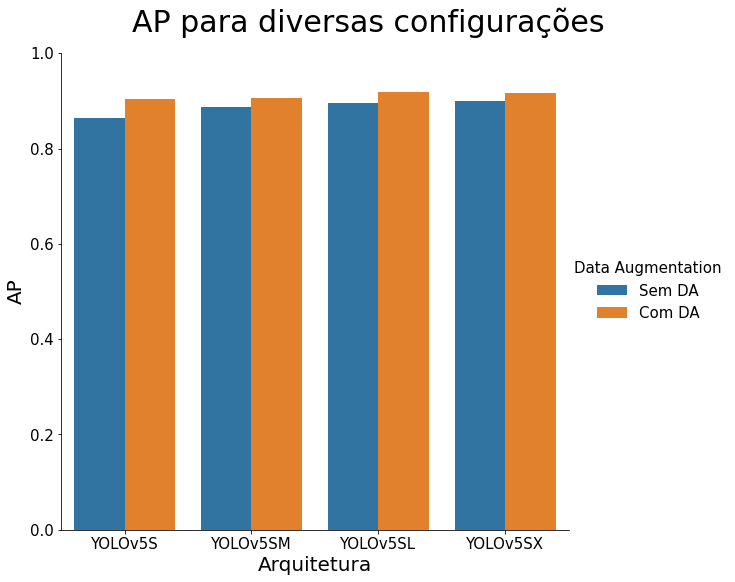

In [ ]:
rp = sns.catplot(x="Arquitetura", y="AP", hue="Data Augmentation", kind="bar", data=ap_nucleos.iloc[np.r_[4:8, 12:16]], height=8)
rp.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
rp.fig.suptitle('AP para diversas configurações', fontsize=30)
rp.set_xlabels(fontsize=20)
rp.set_ylabels(fontsize=20)
rp.set_xticklabels(fontsize=15)
rp.set_yticklabels(fontsize=15)
plt.show()

##Curvas de Loss

[]

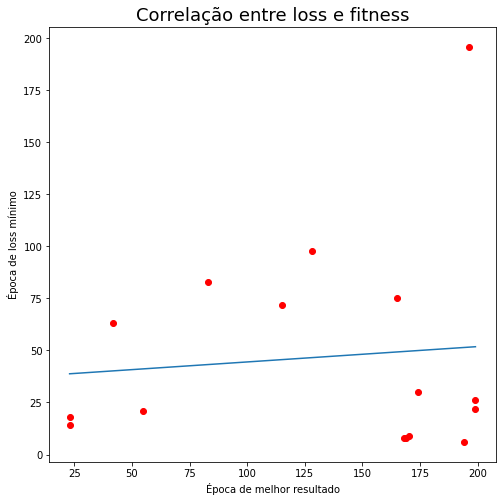

In [ ]:
import numpy as np
from sklearn.linear_model import LinearRegression


epochs = []
loss_min = []
for i in range(len(df_list)):
  epochs.append(df_final.iloc[i,:]["Index"])
  test_loss = df_list[i]["vbox"] + df_list[i]["vobj"]
  loss_min.append(test_loss.idxmin())

x, y = np.array(epochs).reshape(-1, 1), np.array(loss_min)
model = LinearRegression().fit(x, y)
X_t = np.linspace(x.min(), x.max(), 200)
Y_t = model.coef_*X_t + model.intercept_

plt.figure(figsize=(8, 8))
plt.plot(epochs, loss_min, 'ro')
plt.plot(X_t, Y_t)
plt.title("Correlação entre loss e fitness", fontsize=18)
plt.xlabel("Época de melhor resultado")
plt.ylabel("Época de loss mínimo")
plt.plot()

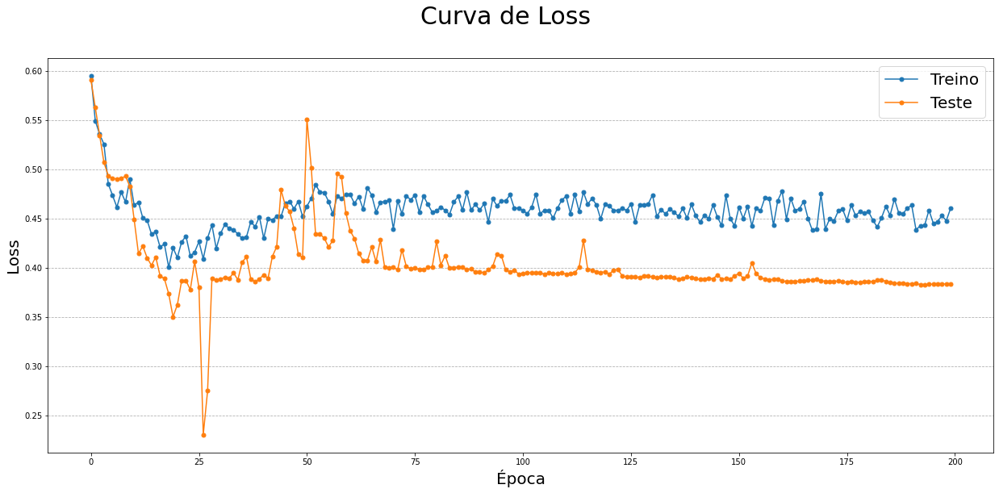

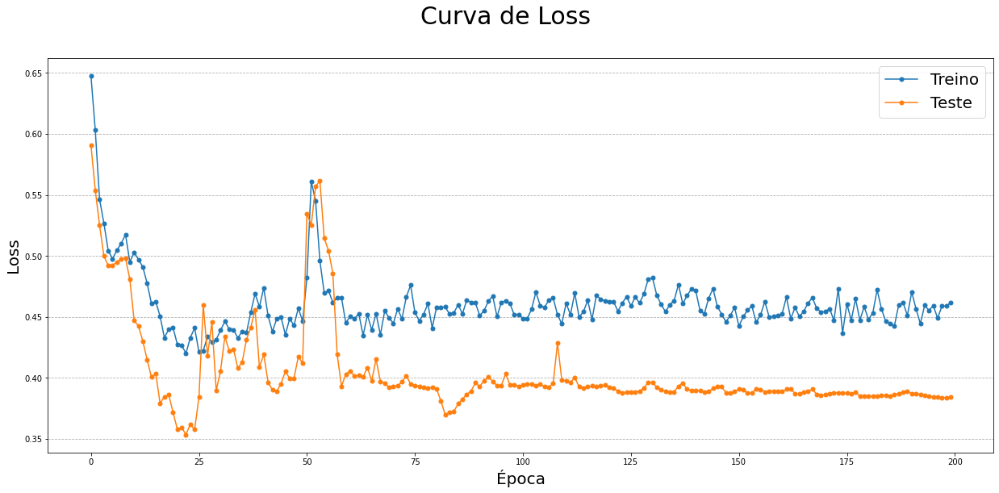

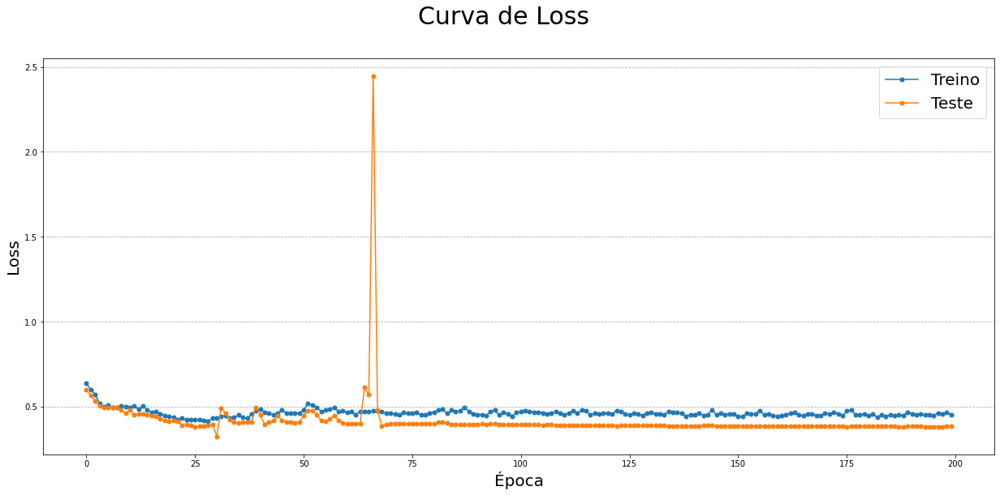

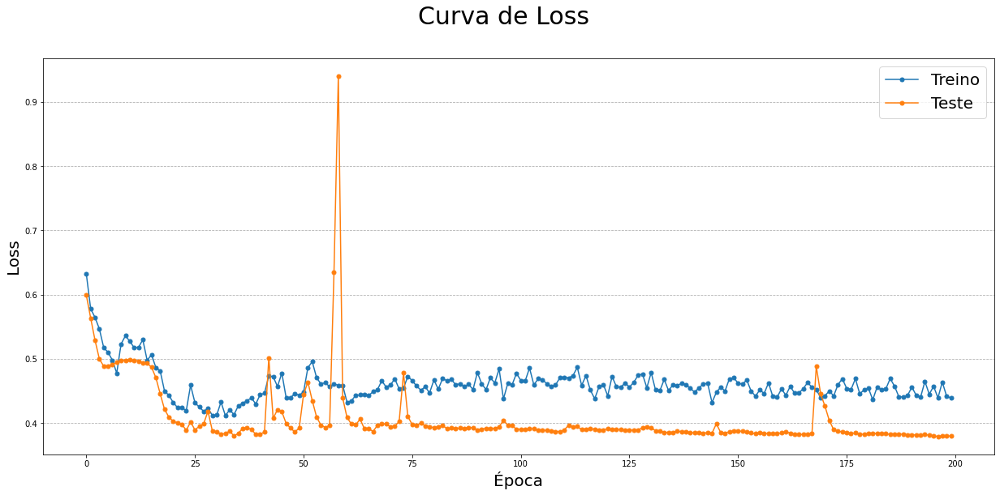

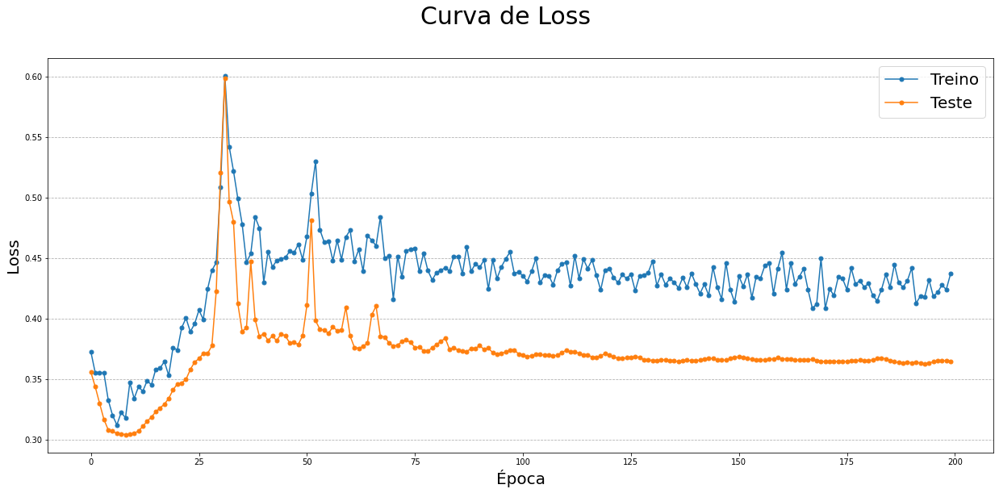

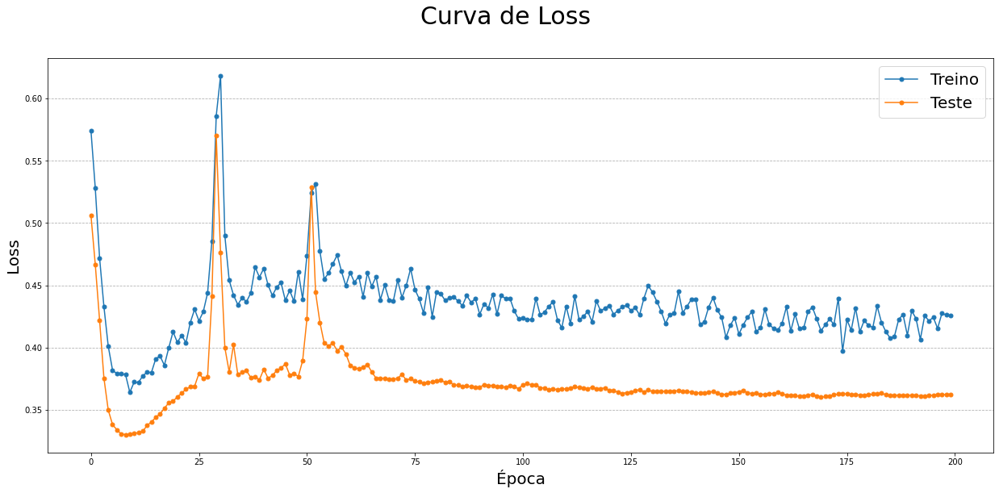

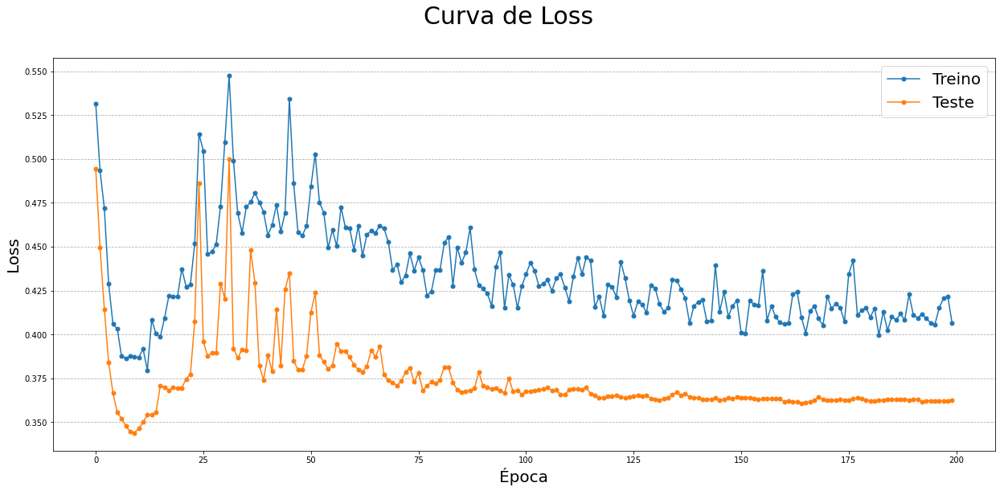

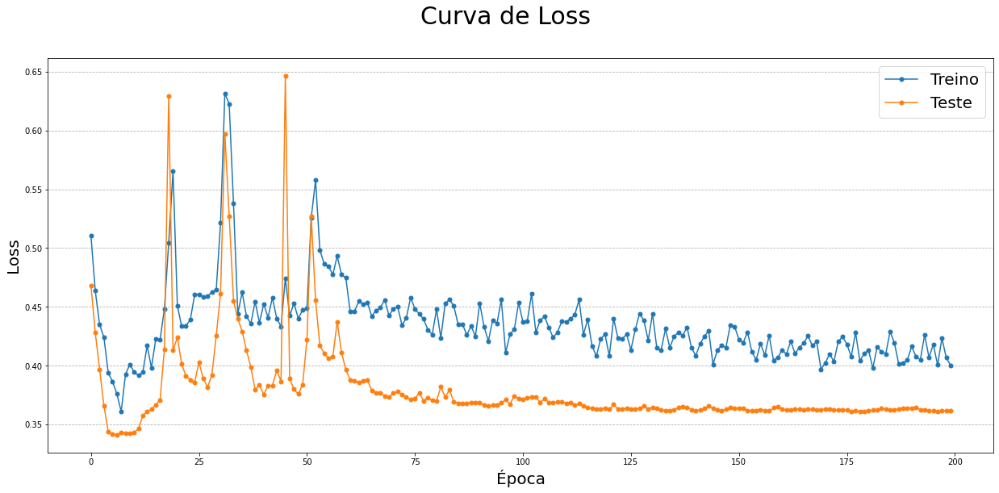

In [ ]:
for df in df_list[0:8]:
  plot_loss(df)

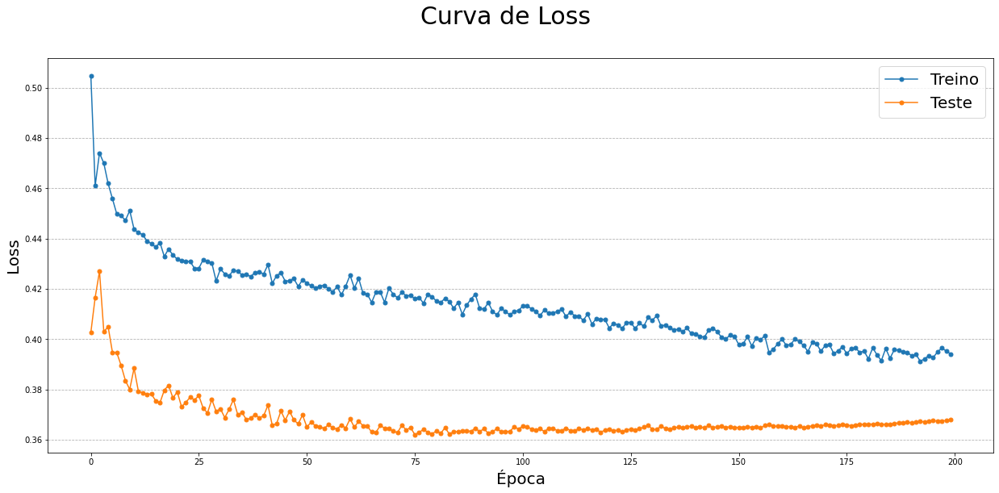

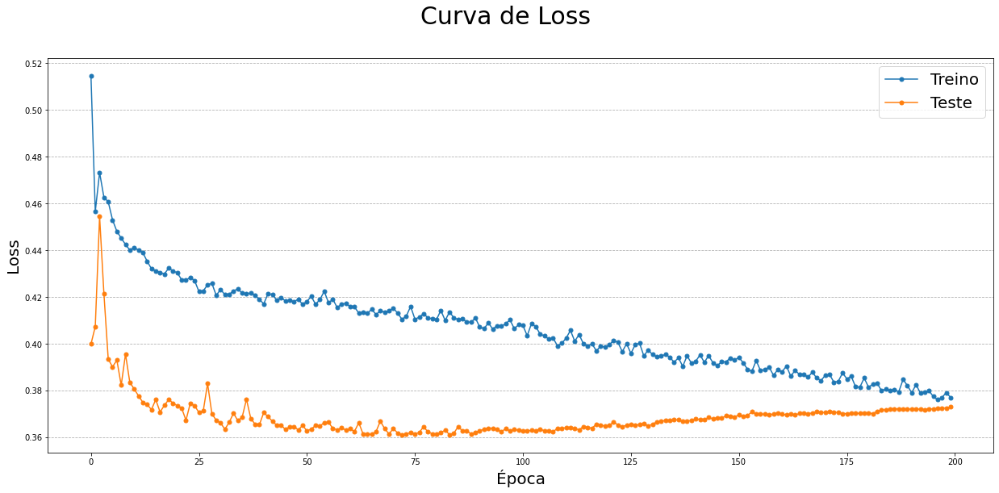

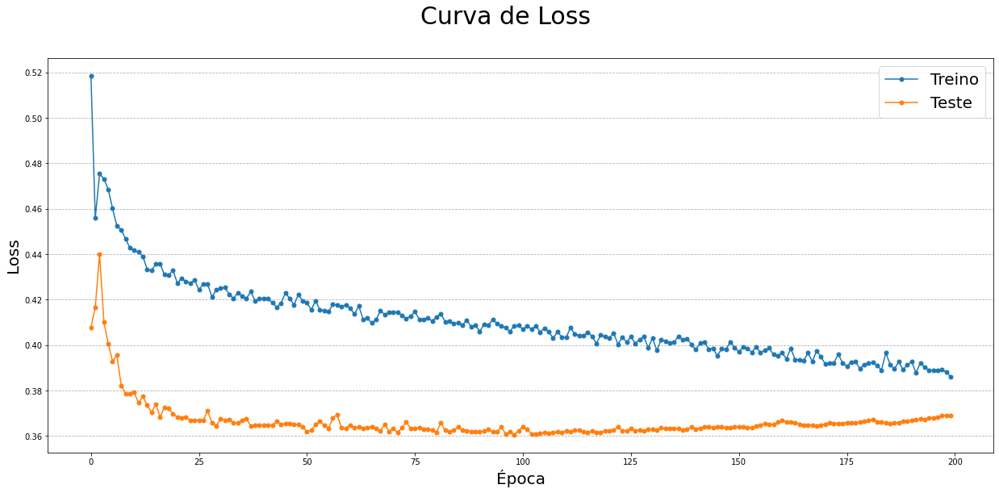

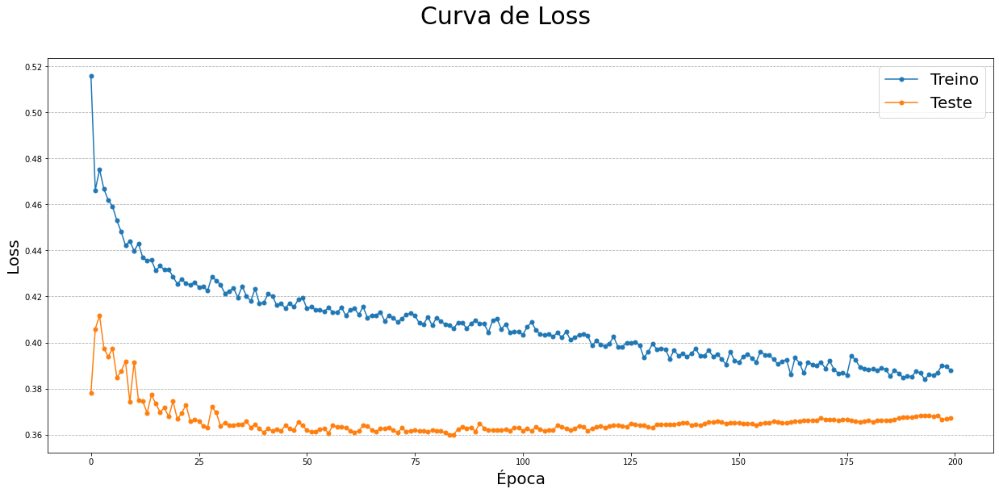

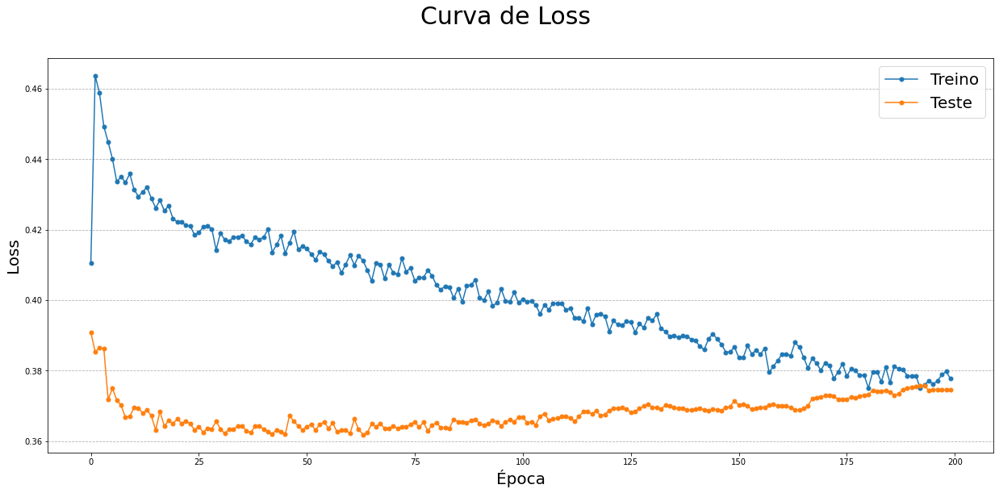

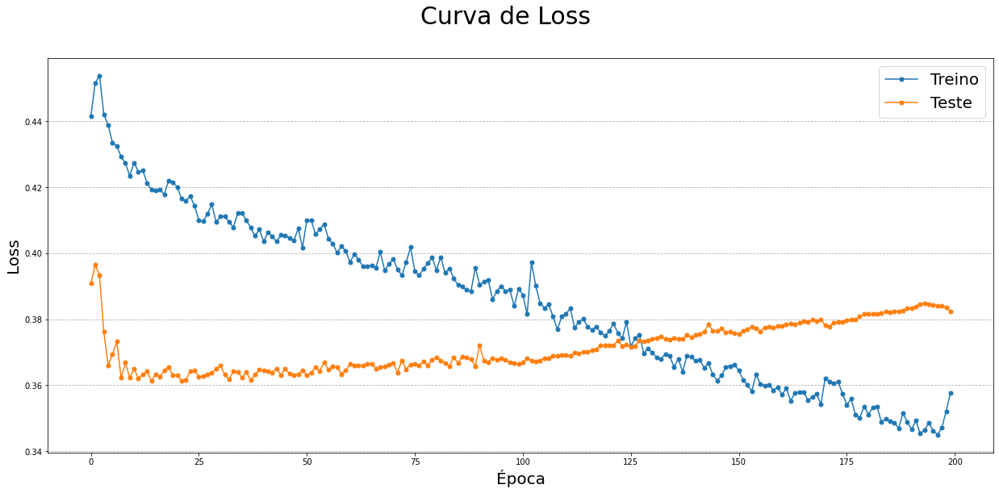

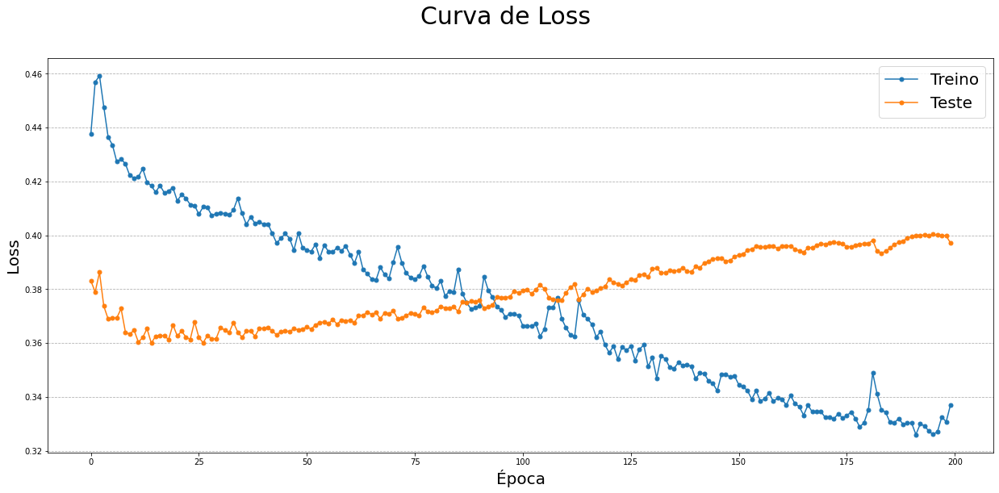

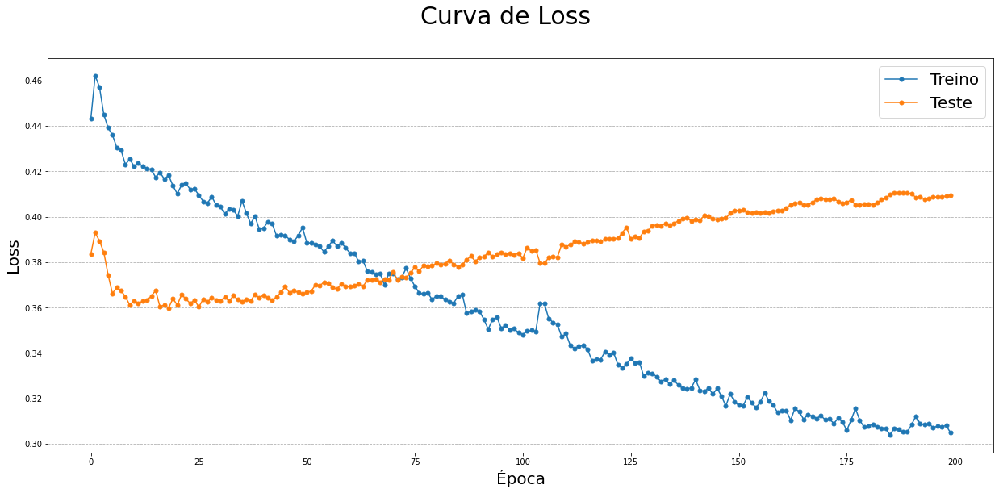

In [ ]:
for df in df_list[8:16]:
  plot_loss(df)